<a href="https://colab.research.google.com/github/DKE-bros/Arizona-Road-Accidents-Analysis-and-Severity-Prediction/blob/main/DataMadness2.0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

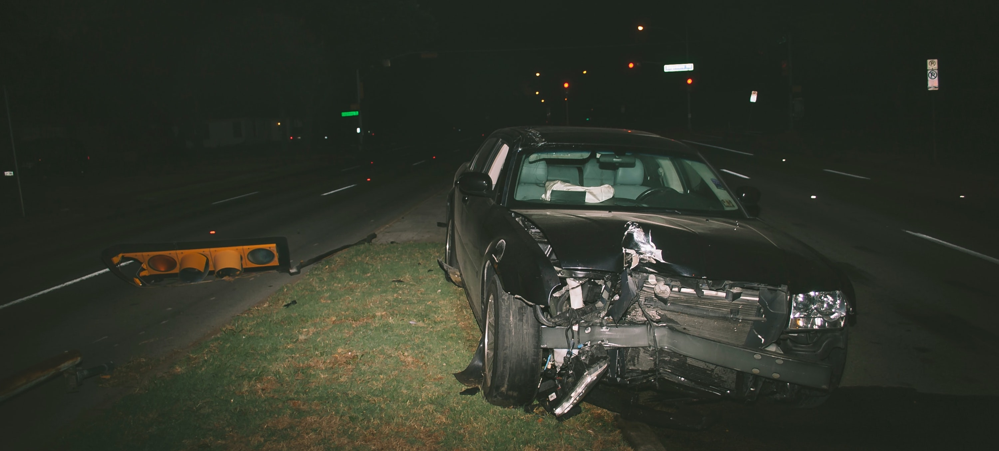

# DKE - Data Analysis


# Data Madness 2021 
#🚗 💥 **Arizona Road Accidents Analysis and Severity Prediction** 💥 🚗

*Clément Detry, Louis Gauthy, Selim Gilon*
*****



💡 Table of contents
1. Introduction 🙋🏻‍♂️
2. Research Questions 🧐 
3. Data Description 📝
4. Ethical Considerations ⚠️
5. Data Cleaning & Preprocessing 🧹
6. Data Analysis and Visualization 📊
7. Severity Prediction Model 🌳
8. Conclusion 🙌

*****

## 1. Introduction 🙋🏻‍♂️

Each year, around 1.35 million people lose their lives on roadways in the world. On average, this is 3,700 people per day. The number of motor vehicles increases each year.  Therefore, we believe that it is primordial to understand what usually causes accidents in order to improve the factors that humans can control (e.g. traffic management, road facilities) and decrease the number of deaths. 

In this work, we will analyze the road accidents that have occurred in Arizona between 2016 and 2020. 
Our goal is to answer some research questions (find them in the next section) which are mainly related to the time, location, weather conditions, and road facilities of the accidents.
We will also use some machine learning techniques to build some models that predict the severity of the accidents based on different features. 


*****
## 2. Research Questions 🧐

As previously mentioned, we are interested in the influence of circumstances on accidents. We are thus willing to extract the best and the worse driving circumstances from the data set as well as exploring which circumstances correlate well with accident frequency and severity. These pieces of information could give drivers bits of advice on when to try to avoid driving when they should pay the most attention when driving. Here are the questions that we will try to answer. Note that all of them concern accidents in Arizona between 2016 and 2020. 

1.   How many accidents happen on average per day? ✅

2.   What's the average interval time between 2 accidents? ✅

3.   What was the most dangerous day/month ever between 2016 and 2020? ✅

5.   What are the road facilities that are included in accidents? Which are the most present? ✅

6.   Can a model predict the severity of an accident based on some features? What are the best one's performance results? ✅

7.   How severe are accidents in AZ? ✅ 

8.   Is there any relation between the weather conditions and the severity of the crash? What is the relation? ✅

9.   What are the most dangerous areas (counties) in Arizona? ✅

10.  What are the most dangerous roads in AZ? ✅

11.  Do the time and location have an impact on the severity of the crash? ✅

12.   How are accidents distributed through days, trimesters,years, and 4 years? ✅

13.   Which weather conditions are the most frequent in accidents? ✅

14.   What are the common accidents' descriptions? ✅



*****

## 3. Data Description 📝

The data is collected from the following website: https://smoosavi.org/datasets/us_accidents. Sobhan Moosavi, Research Scientist at Lyft, is the owner of it and agrees the data set to be used for research, or academic applications purposes. The original data set covers accidents from all US states. We chose to focus on a single State because the full data set is colossal (1.6GB in CSV format - 3.5 million separate traffic accidents) and because we wanted to limit the analysis to a unique climate. Arizona appeared to be a good candidate State since it contains a fair amount of data instances (~**90 000 accidents** recorded from **February 2016 to December 2020**) and its climate is quite stable and single, with only two seasons and a few natural calamities (storms, dust storms).
 
 The data contains information about the source of the accident, the severity, the start and end location, the time, the weather conditions, the closest airport, the road facilities, etc. Here is a more detailed table with each attribute description, extract with a data scraping technique from the dataset website.


### Acknowledgement

1. Moosavi, Sobhan, Mohammad Hossein Samavatian, Srinivasan Parthasarathy, and Rajiv Ramnath. [“A Countrywide Traffic Accident Dataset.”](https://arxiv.org/abs/1906.05409), arXiv preprint arXiv:1906.05409 (2019).

2. Moosavi, Sobhan, Mohammad Hossein Samavatian, Srinivasan Parthasarathy, Radu Teodorescu, and Rajiv Ramnath. [“Accident Risk Prediction based on Heterogeneous Sparse Data: New Dataset and Insights.”](https://arxiv.org/abs/1909.09638) In proceedings of the 27th ACM SIGSPATIAL International Conference on Advances in Geographic Information Systems, ACM, 2019.

In [1]:
import pandas as pd
import bs4
import requests

URL = "https://smoosavi.org/datasets/us_accidents"

web_page = bs4.BeautifulSoup(requests.get(URL, headers={
    "UserAgent": "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/65.0.3325.183 Safari/537.36"
}).text, "lxml")

# imf_table = web_page.find_all(name="table", attrs={"class": "wikitable"})[0]
imf_table = web_page.find_all(name="table")[0]

# Get the column names of our dataframe. 
# `children` is an iterator and to index it we must first convert it to a list.
columns = list(imf_table.tbody.children)[0]
columns = [elem.text.strip("\n ") 
           for elem in columns 
           if type(elem) != bs4.NavigableString]

rows = []

for i, row in enumerate(imf_table.tbody.find_all("tr")):
    # Skip the header
    if i <= 1 or type(row) == bs4.NavigableString:
      continue

    tds = row.find_all("td")
    
    attribute = tds[1].text
    description = tds[2].text
    
    rows.append((attribute, description))

columns.pop(0)
columns.pop()
data_frame = pd.DataFrame(rows, columns=columns)

pd.set_option('display.max_colwidth', None)

data_frame

,ID,This is a unique identifier of the accident record.
0,TMC,A traffic accident may have a Traffic Message Channel (TMC) code which provides more detailed description of the event.
1,Severity,"Shows the severity of the accident, a number between 1 and 4, where 1 indicates the least impact on traffic (i.e., short delay as a result of the accident) and 4 indicates a significant impact on traffic (i.e., long delay)."
2,Start_Time,Shows start time of the accident in local time zone.
3,End_Time,Shows end time of the accident in local time zone. End time here refers to when the impact of accident on traffic flow was dismissed.
4,Start_Lat,Shows latitude in GPS coordinate of the start point.
5,Start_Lng,Shows longitude in GPS coordinate of the start point.
6,End_Lat,Shows latitude in GPS coordinate of the end point.
7,End_Lng,Shows longitude in GPS coordinate of the end point.
8,Distance(mi),The length of the road extent affected by the accident.
9,Description,Shows natural language description of the accident.


*****
## 4. Ethical Considerations ⚠️

The data has been collected by a professional researcher on two different traffic API’s. The most used one is MapQuest, a reliable open-source API. The second one is the traffic API Bing from Microsoft which is also reliable.

We have made two considerations on the data. First, the data contained four different attributes that were used to describe the beginning and end of the day. Namely, Sunrise Sunset, the Civil Twilight, the Nautical Twilight, and the Astronomical Twilight. For simplicity, we decided to keep the most trivial one, Sunrise/Sunset. 
Second, we noticed that two different time zones were sitting in the State of Arizona. However, ± 99.4% of the data was included in the Eastern coast Time Zone. We then assumed that the rest of the data was also part of it.


Throughout this project, we felt that a lot of extra meaning could be added to our analysis of data on road traffic jam was included in the project. For instance, if we observe that there are a lot of accidents on a specific road, it could mean that this one is particularly dangerous due to its turns for example, or it could mean that a huge amount of people drive on this road every day but only a few actually crash.

The results of this project are certainly useful for all Arizona drivers who might know how, when, and where accidents occur on the road and, from there, know when to be more vigilant on the road. However, we can not guarantee that they are still valid for the drivers living in the other part of the world. Moreover, any institution willing to increase road safety or sensitize road users, might also be interested in some of our results. They could for example adapt the traffic regulations such as the speed limit in specific zones.

 


*****
## 5. Data Cleaning & Preprocessing 🧹

Let's start by importing all the libraries.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

import scipy as sc
import numpy as np
import math
import calendar

import pandas as pd
import statsmodels.formula.api as sm
import seaborn as sns
sns.set_style("darkgrid", {"axes.facecolor": ".9"})
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from collections import Counter

import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline  
import plotly
import plotly.express as px
from wordcloud import WordCloud
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
from urllib.request import urlopen
import json

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


The first question we might wanna answer is: 
 
 
 Where is Arizona actually? 

Let's plot it on the US map. 

In [3]:
states = {'state': ['AZ'], 'value': [1]}

fig = px.choropleth(states,  
                    locations="state",  
                    color="value",  
                    hover_name="state", 
                    locationmode = 'USA-states') 
fig.update_layout(
    title_text = 'US States - Arizona',
    geo_scope='usa',
)
fig.show()
# Do not worry about the legend in the plot below. It's not useful for our purpose.

In [4]:
# load data
# Note that we previously extracted out the AZ data from the original data set and we stored it in another csv file.
df = pd.read_csv('/content/drive/MyDrive/DKE Bros/Year 3/Block 3.4/DataMadness/accidents_AZ_2020.csv',index_col=0) 

# Let's replace the "()" by "_" to avoid python to get confused since it could interpret it as a function in some cases.
df.rename(columns={'Distance(mi)': 'Distance_mi', 'Temperature(F)': 'Temperature_F', 'Wind_Chill(F)': 'Wind_Chill_F', 'Humidity(%)': 'Humidity_%', 'Pressure(in)': 'Pressure_in', 'Visibility(mi)': 'Visibility_mi', 'Wind_Speed(mph)': 'Wind_Speed_mph', 'Precipitation(in)' : 'Precipitation_in'}, inplace=True)

# We decided to only keep the table columns which were relevant for our research questions
# The source of the data is useless. TMC as well because it doesn't give us any additional info.
# We will not consider the end location of the accidents but only the start ones.
# We also won't consider the wind chill because the values are very similar to the temperature and it doesn't make any sense to use the wind chill instead of the temperatures themselves.
# The side on which the accident happened is not relevant for our RQ. 
# The city, and zipcode are useless since we have more precise coordinates (lat and long).
# Moreover, all accidents in this dataset happened in AZ so the feature State and Country are useless as well.
# We will not consider the closest airport neither.
df.drop(columns=['Source', 'TMC', 'End_Lat', 'End_Lng', 'Distance_mi', 'Number', 'Wind_Chill_F', 'Side', 'City', 'State', 'Zipcode', 'Country', 'Airport_Code'], inplace=True)

# We noticed that Arizona had two timezones (Mountain and Pacific) in the whole state
# More than 99.4% of the accidents were located in the Mountain one, so we did not consider the 1 hour time difference
df.drop(columns=['Timezone'], inplace=True)

# Currently, there are 3 different features that determine whether it's day or night.
# The difference between day and night that could have a considerable impact on the car accidents is the difference of luminosity.
# Therefore, we just keep the sunset/sunrise feature (determining whether there is natural light or not).
# We made this choice because it is the one that tells us if there is sun or not
df.drop(columns=['Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight'], inplace=True)

# We decided to drop the rows in which NaN occured in the weather condition column because since it contains qualitative data.
# We can neither compute a mean or so, nor fill it in manually
df.dropna(subset = ['Weather_Condition'], inplace=True)

# To handle the NaN values for the weather attributes, we choosed to replace them with the value in the row before (data from the same day)
def replace_nan(attribut):
  for index in range(len(df[attribut])):
    if (math.isnan(df[attribut].iloc[index])):
      df[attribut].replace({df[attribut].iloc[index] : df[attribut].iloc[index-1]}, inplace=True)

replace_nan('Temperature_F')
replace_nan('Humidity_%')
replace_nan('Pressure_in')
replace_nan('Wind_Speed_mph')
replace_nan('Precipitation_in')
replace_nan('Visibility_mi')

# Due to the multiple different types of weather conditions, we decided to group some of them togehter.
# Fair, Cloudy, Clear, Rain, Haze, Windy, Snow, Thunder, Storm, Dust
df['Weather_Condition'].replace('^.*[Cc]loud.*', 'Cloudy', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Oo]vercast.*', 'Cloudy', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Rr]ain.*', 'Rain', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Ss]hower.*', 'Rain', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Ss]now.*', 'Snow', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Ss]torm.*', 'Storm', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Tt]hunder.*', 'Thunder', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Dd]ust.*', 'Dust', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Hh]aze.*', 'Haze', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Ff]og.*', 'Haze', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Ss]moke.*', 'Haze', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Dd]rizzle.*', 'Haze', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Mm]ist.*', 'Haze', regex=True, inplace=True)
df['Weather_Condition'].replace('^.*[Ww]ind.*', 'Windy', regex=True, inplace=True)

# Here, we just add a new column called Start_Date and Start_Month which could be useful for some later plots and analysis.
df.insert(2, 'Start_Date', df['Start_Time'].map(lambda x : str(x)[:10]), True)
df.insert(3, 'Start_Month', df['Start_Time'].map(lambda x : str(x)[5:7]), True)
df['Start_Month'].replace('01', 'January', inplace=True)
df['Start_Month'].replace('02', 'February', inplace=True)
df['Start_Month'].replace('03', 'March', inplace=True)
df['Start_Month'].replace('04', 'April', inplace=True)
df['Start_Month'].replace('05', 'May', inplace=True)
df['Start_Month'].replace('06', 'June', inplace=True)
df['Start_Month'].replace('07', 'July', inplace=True)
df['Start_Month'].replace('08', 'August', inplace=True)
df['Start_Month'].replace('09', 'September', inplace=True)
df['Start_Month'].replace('10', 'October', inplace=True)
df['Start_Month'].replace('11', 'November', inplace=True)
df['Start_Month'].replace('12', 'December', inplace=True)

# We noticed duplicates values for the cardinal points, let's group them together
df['Wind_Direction'].replace('North', 'N', inplace=True)
df['Wind_Direction'].replace('South', 'S', inplace=True)
df['Wind_Direction'].replace('West', 'W', inplace=True)
df['Wind_Direction'].replace('East', 'E', inplace=True)
df['Wind_Direction'].replace('Variable', 'VAR', inplace=True)
df['Wind_Direction'].replace('Calm', 'CALM', inplace=True)

# Let's check the shape of the dataframe (how much data and how many features are left)
print('Shape =', df.shape)
print()
# Head of the dataframe
df.head(10)

Shape = (89420, 33)



,Severity,Start_Time,Start_Date,Start_Month,End_Time,Start_Lat,Start_Lng,Description,Street,County,Weather_Timestamp,Temperature_F,Humidity_%,Pressure_in,Visibility_mi,Wind_Direction,Wind_Speed_mph,Precipitation_in,Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A-513395,2,2020-12-31 08:33:30,2020-12-31,December,2020-12-31 09:18:09,33.670841,-112.371712,Restrictions due to accident on R H Johnson Blvd both ways at Stardust Blvd.,N Stardust Blvd,Maricopa,2020-12-31 08:58:00,43.0,39.0,28.83,10.0,N,5.0,0.0,Cloudy,False,False,True,False,False,False,False,False,False,False,False,True,False,Day
A-513396,2,2020-12-31 09:32:49,2020-12-31,December,2020-12-31 11:03:48,33.953491,-112.709152,Single alternate line traffic due to accident on US-60 Grand Ave both ways at 100th Ave.,N US Highway 60 89,Maricopa,2020-12-31 09:31:00,45.0,34.0,28.83,10.0,N,3.0,0.0,Haze,False,False,False,False,False,False,False,False,False,False,False,False,False,Day
A-513397,2,2020-12-31 12:54:03,2020-12-31,December,2020-12-31 19:20:43,34.720909,-114.312477,Lane blocked due to accident on AZ-95 Southbound between I-40 Exit 9 and Portico Dr.,AZ-95,Mohave,2020-12-31 12:56:00,60.0,14.0,28.86,10.0,NNW,12.0,0.0,Fair,False,False,False,False,False,False,False,False,False,True,False,False,False,Day
A-513398,3,2020-12-31 16:04:19,2020-12-31,December,2020-12-31 17:28:39,33.457832,-112.340706,Lane blocked due to accident on I-10 Eastbound at Exit 129 Dysart Rd.,I-10 E,Maricopa,2020-12-31 15:47:00,57.0,21.0,28.85,10.0,E,5.0,0.0,Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day
A-513399,2,2020-12-31 18:47:26,2020-12-31,December,2020-12-31 19:48:45,34.459019,-112.524048,Lane blocked due to accident on AZ-89 Southbound between Fr-9407E and Fr-12.,S State Route 89,Yavapai,2020-12-31 18:53:00,36.0,46.0,24.84,10.0,W,6.0,0.0,Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Night
A-513400,2,2020-12-31 04:52:14,2020-12-31,December,2020-12-31 06:07:46,33.662868,-112.116989,Accident on Yorkshire Dr at 27th Ave.,N 27th Ave,Maricopa,2020-12-31 04:53:00,40.0,29.0,28.37,10.0,CALM,0.0,0.0,Fair,False,False,True,False,False,False,False,False,False,False,False,True,False,Night
A-513401,2,2020-12-31 06:07:28,2020-12-31,December,2020-12-31 08:41:37,32.323399,-111.037300,Accident on Orange Grove Rd at Camino De La Tierra.,N Camino de la Tierra,Pima,2020-12-31 05:58:00,36.0,42.0,27.19,10.0,SSE,9.0,0.0,Fair,False,False,True,False,False,False,False,False,False,False,False,True,False,Night
A-513402,2,2020-12-31 06:19:54,2020-12-31,December,2020-12-31 07:20:58,32.272003,-111.010162,Accident on Prince Rd near Business Center Dr.,N Casa Grande Hwy,Pima,2020-12-31 05:58:00,36.0,42.0,27.19,10.0,SSE,9.0,0.0,Fair,False,False,False,False,False,False,True,False,False,False,False,True,False,Night
A-513403,2,2020-12-31 06:40:22,2020-12-31,December,2020-12-31 07:10:11,33.578571,-112.053680,Accident on Cave Creek Rd at Cheryl Dr.,N Cave Creek Rd,Maricopa,2020-12-31 06:53:00,40.0,38.0,28.35,10.0,CALM,0.0,0.0,Fair,False,False,True,False,False,False,False,False,False,False,False,False,False,Night


It is now time to explore a bit the data and remove the outliers.

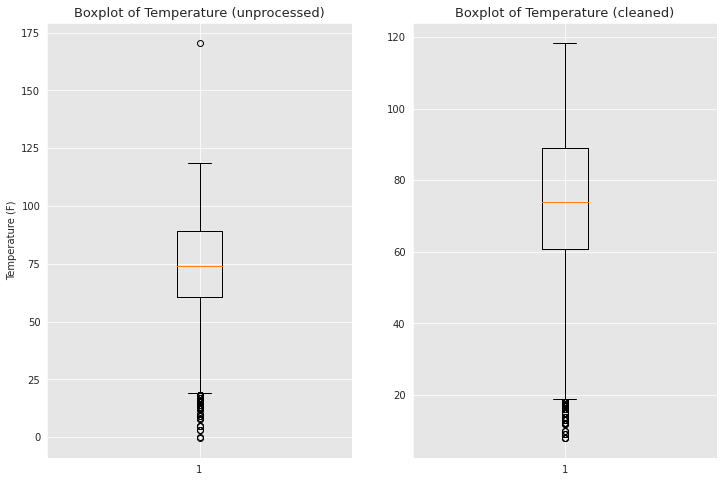

In [5]:
# To detect enventual outliers in the temperature column, we can show the box plot
fig = plt.figure(figsize=(12, 8))

ax1 = fig.add_subplot(121)
ax1 = plt.boxplot(df['Temperature_F'])
plt.title("Boxplot of Temperature (unprocessed)", fontsize=13)
plt.ylabel("Temperature (F)")

# Only 1 accident is above 125deg farenheit
df = df[(df['Temperature_F'] < 125)]
# Only 4 accidents are below 5deg farenheit
df = df[(df['Temperature_F'] > 5)]
print()

ax2 = fig.add_subplot(122)
ax2 = plt.boxplot(df['Temperature_F'])
plt.title("Boxplot of Temperature (cleaned)", fontsize=13)
plt.show()
fig.tight_layout(pad=3.0)

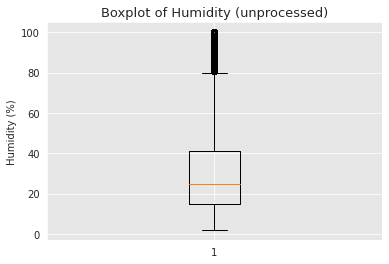

In [6]:
plt.boxplot(df['Humidity_%'])
plt.title("Boxplot of Humidity (unprocessed)", fontsize=13)
plt.ylabel("Humidity (%)")
plt.show()
# There are some outliers but there are quite a lot and the values are plausible so let's keep these.

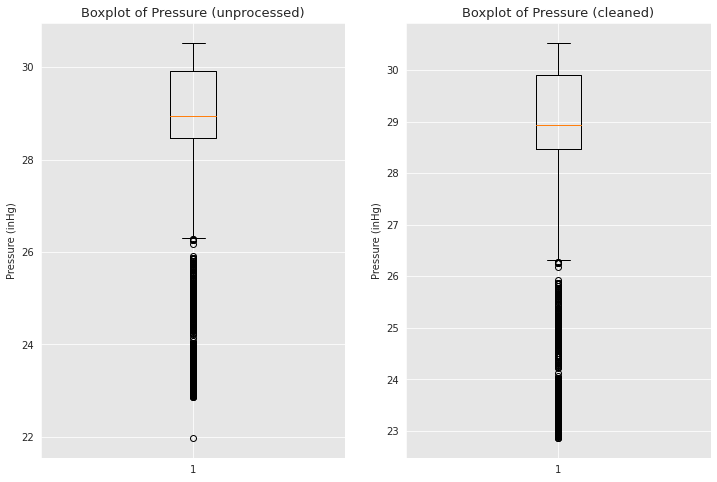

In [7]:
# Explain that outliers are due to mountains in AZ

fig = plt.figure(figsize=(12, 8))

ax1 = fig.add_subplot(121)
ax1 = plt.boxplot(df['Pressure_in'])
plt.title("Boxplot of Pressure (unprocessed)", fontsize=13)
plt.ylabel("Pressure (inHg)")

# Let's remove the otulier which is at 22
df = df[df['Pressure_in'] > 22.2]
print()

ax2 = fig.add_subplot(122)
ax2 = plt.boxplot(df['Pressure_in'])
plt.title("Boxplot of Pressure (cleaned)", fontsize=13)
plt.ylabel("Pressure (inHg)")
plt.show()
fig.tight_layout(pad=3.0)

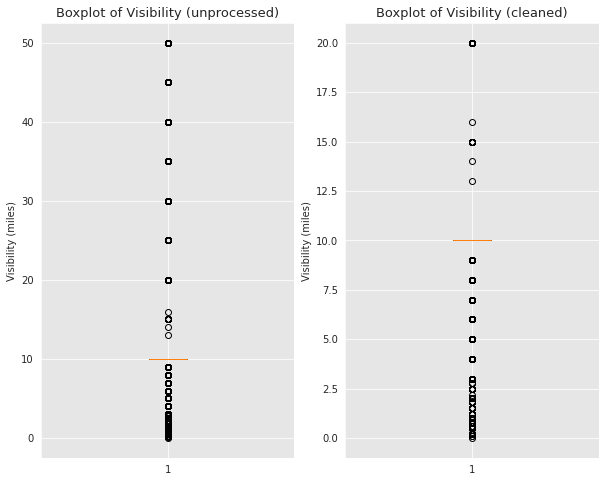

In [8]:
fig = plt.figure(figsize=(10, 8))

ax1 = fig.add_subplot(121)
ax1 = plt.boxplot(df['Visibility_mi'])
plt.title("Boxplot of Visibility (unprocessed)", fontsize=13)
plt.ylabel("Visibility (miles)")

# Let's remove the 7 outliers that are very far from all the rest of the data (also, a visibility of 50 miles doesn't make too much sense to us).
df = df[df['Visibility_mi'] <= 20]
print()

ax2 = fig.add_subplot(122)
ax2 = plt.boxplot(df['Visibility_mi'])
plt.title("Boxplot of Visibility (cleaned)", fontsize=13)
plt.ylabel("Visibility (miles)")
plt.show()
fig.tight_layout(pad=3.0)

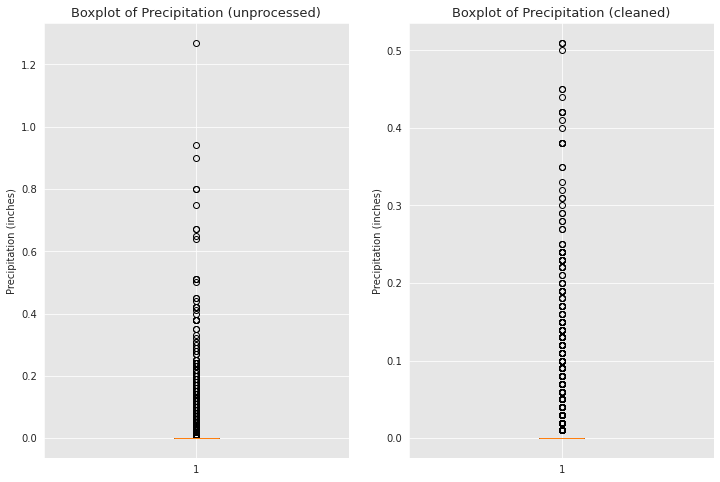

In [9]:
fig = plt.figure(figsize=(12, 8))

ax1 = fig.add_subplot(121)
ax1 = plt.boxplot(df['Precipitation_in'])
plt.title("Boxplot of Precipitation (unprocessed)", fontsize=13)
plt.ylabel("Precipitation (inches)")

# remove the outliers above 0.6. These values are plausible but there are just a few instances and this is nothing compared to the huge amount of data.
df = df[df['Precipitation_in'] < 0.6]
print()
# There are still some outliers but that's because it doesn't rain much in AZ, it's very dry. 
# We want to keep some data about accidents that happened when it was raining because it might have an impact om the severity or so.

ax2 = fig.add_subplot(122)
ax2 = plt.boxplot(df['Precipitation_in'])
plt.title("Boxplot of Precipitation (cleaned)", fontsize=13)
plt.ylabel("Precipitation (inches)")
plt.show()
fig.tight_layout(pad=3.0)

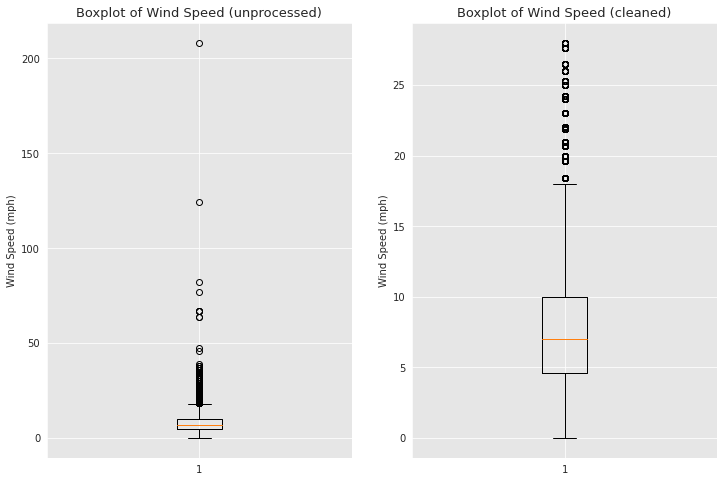

In [10]:
fig = plt.figure(figsize=(12, 8))

ax1 = fig.add_subplot(121)
ax1 = plt.boxplot(df['Wind_Speed_mph'])
plt.title("Boxplot of Wind Speed (unprocessed)", fontsize=13)
plt.ylabel("Wind Speed (mph)")

# Let's keep the 0.999 quantile
df = df[df['Wind_Speed_mph'] < df['Wind_Speed_mph'].quantile(0.999)]
print()

ax2 = fig.add_subplot(122)
ax2 = plt.boxplot(df['Wind_Speed_mph'])
plt.title("Boxplot of Wind Speed (cleaned)", fontsize=13)
plt.ylabel("Wind Speed (mph)")
plt.show()
fig.tight_layout(pad=3.0)

*****
## 6. Data Analysis and Visualization 📊

### How severe are accidents in AZ? 💥

Text(0.5, 1.0, "Distribution of the Accidents' Severity")

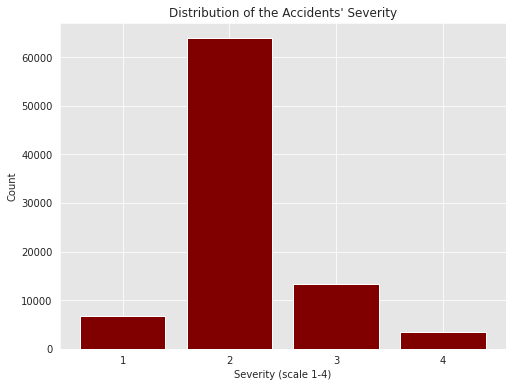

In [11]:
fig = plt.figure(figsize=(8, 6))

positions = np.arange(1,5,1)
plt.bar(df['Severity'].value_counts().index,df['Severity'].value_counts().values,color ='maroon')
plt.xticks(positions, positions)
plt.xlabel("Severity (scale 1-4)")
plt.ylabel("Count")
plt.title("Distribution of the Accidents' Severity")

As we can see on the histogram above, most of the accidents have a severity of 2. The severity of 4 is super rare. Severities 1 and 3 are minorities as well. It's very unbalanced but we will deal with that in the model prediction section.



### What are the common accidents' descriptions? 🚧


Let's analyse the description (set of words) of each accident. We will use a word cloud to visualize the frequency of each word in the desciptions over all the data.

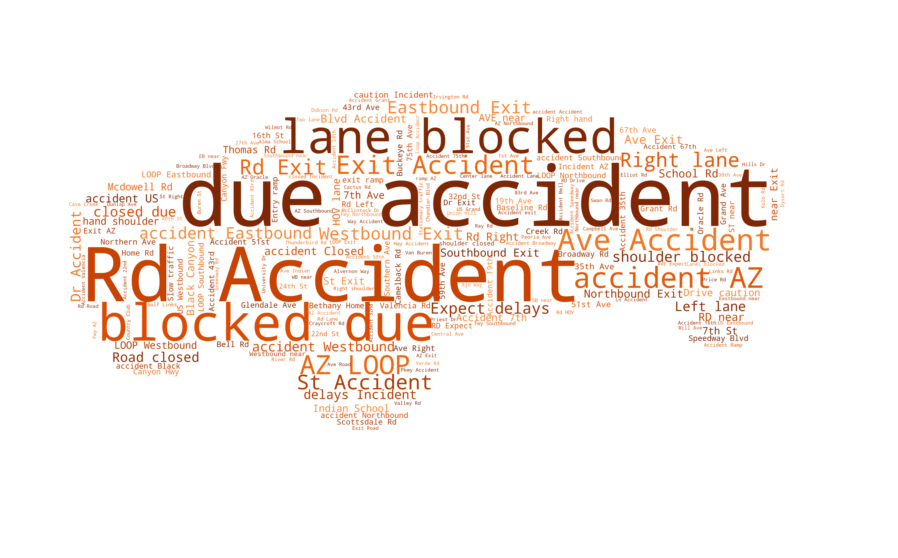

In [12]:
cmap_O = mpl.cm.Oranges(np.linspace(0,1,20))
cmap_O = mpl.colors.ListedColormap(cmap_O[10:,:-1])

#Font parameters for our Title
font = {'family': 'serif',
        'color':  'darkred',
        'weight': 'normal',
        'size': 36,
        }

#Creating variable with data for this Word Cloud
textS = ' '.join(df['Description'].tolist())

# Mask for the Word Cloud
cb_mask = np.array(Image.open('/content/drive/MyDrive/DKE Bros/Year 3/Block 3.4/DataMadness/cb2.PNG'))
stop_words=set(STOPWORDS)

cb_wc=WordCloud(width=400,height=200,mask=cb_mask,random_state=101, max_font_size=450,
                 min_font_size=3,stopwords=stop_words,background_color="white",
                 scale=3,max_words=200,collocations=True,colormap=cmap_O)

#Generate it
cb_wc.generate(str(textS))

fig=plt.figure(figsize=(30,10))
plt.ylim(-250,2700)
plt.gca().invert_yaxis()
plt.axis("off")
plt.imshow(cb_wc,interpolation='bilinear')
plt.show()

Nice cybertruck right ;) 


We can observe the most frequent accidents' descriptions in the wordcloud above.

### How many accidents happen on average per day? 📅

In [13]:
print("There are",int(len(df)/1652),"accidents per day in average.")

There are 52 accidents per day in average.


### Which weather conditions are the most frequent in accidents? 🌦

Let's visualize a bar plot with the distribution of the accidents over the weather conditions. We will also perform a normalization in order to know under which weather conditions accidents are most likely to happen. But first, let's start with a word cloud.

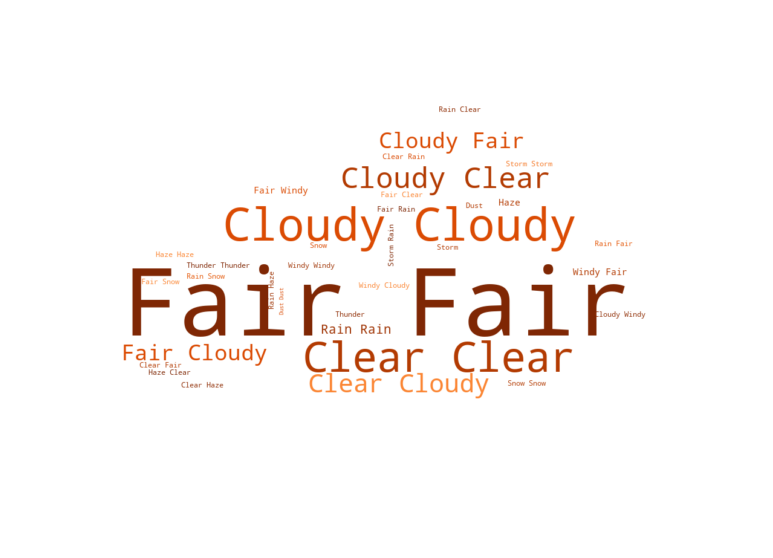

In [14]:
cmap_O = mpl.cm.Oranges(np.linspace(0,1,20))
cmap_O = mpl.colors.ListedColormap(cmap_O[10:,:-1])

#Font parameters for our Title
font = {'family': 'serif',
        'color':  'darkred',
        'weight': 'normal',
        'size': 36,
        }

#Creating variable with data for this Word Cloud
textS = ' '.join(df['Weather_Condition'].tolist())

#Creating Mask for Word Cloud
weather_mask = np.array(Image.open('/content/drive/MyDrive/DKE Bros/Year 3/Block 3.4/DataMadness/nuage.jpg'))
stop_words=set(STOPWORDS)

#Word Cloud Creation 
Weather_wc=WordCloud(width=400,height=200,mask=weather_mask,random_state=101, max_font_size=450,
                 min_font_size=3,stopwords=stop_words,background_color="white",
                 scale=3,max_words=200,collocations=True,colormap=cmap_O)

#Generate Word Cloud
Weather_wc.generate(str(textS))

fig=plt.figure(figsize=(30,10))
plt.ylim(0,900)
#plt.xlim(0,2650)
plt.gca().invert_yaxis()
#plt.gca().invert_xaxis()
plt.axis("off")
plt.imshow(Weather_wc,interpolation='bilinear')
plt.show()

We can see that most accidents happen when the weather is considered quite fair, clear. Haze, snow, rain and thunder are very rare. It doesn't necessarily mean that accidents are more likely to happen when the conditions are good. Indeed, most of the time, the weather is great in Arizona so the data is very unbalanced. 

In [15]:
# Normalization

# Dataframe with only the weather condition and the time. Of course, each row still corresponds to an accident. 
sorted_weather_timestamp = df[['Weather_Timestamp', 'Weather_Condition']]
# Sort by date
sorted_weather_timestamp = sorted_weather_timestamp.sort_values(['Weather_Timestamp', 'Weather_Condition'], ascending = (True, False))
sorted_weather_timestamp['Weather_Timestamp'] = sorted_weather_timestamp['Weather_Timestamp'].map(lambda x : x[11:13])
sorted_weather_timestamp['Weather_Timestamp'] = sorted_weather_timestamp['Weather_Timestamp'].astype(int)

previous_hour = -1
index = 0

weather_list = {'Fair':0, 'Cloudy':0, 'Clear':0, 'Rain':0, 'Haze':0, 'Windy':0, 'Snow':0, 'Thunder':0, 'Storm':0, 'Dust':0}
weather_checked = {'Fair':False,'Cloudy':False,'Clear':False,'Rain':False,'Haze':False,'Windy':False,'Snow':False,'Thunder':False,'Storm':False,'Dust':False}

# Method to count the number of days with a specific weather condition (at anytime of the day).
for hour in sorted_weather_timestamp['Weather_Timestamp']:
  if hour >= previous_hour:
    current_meteo = sorted_weather_timestamp.iloc[index][1];
    weather_checked[current_meteo] = True
  else:
    for item in weather_checked:
      if weather_checked[item]:
        weather_list[item]+=1

    weather_checked = {'Fair':False,'Cloudy':False,'Clear':False,'Rain':False,'Haze':False,'Windy':False,'Snow':False,'Thunder':False,'Storm':False,'Dust':False}
    weather_checked[current_meteo] = True
  
  previous_hour = hour
  index+=1

accident_counts = df['Weather_Condition'].value_counts()

norm = list(map(int, weather_list.values()))

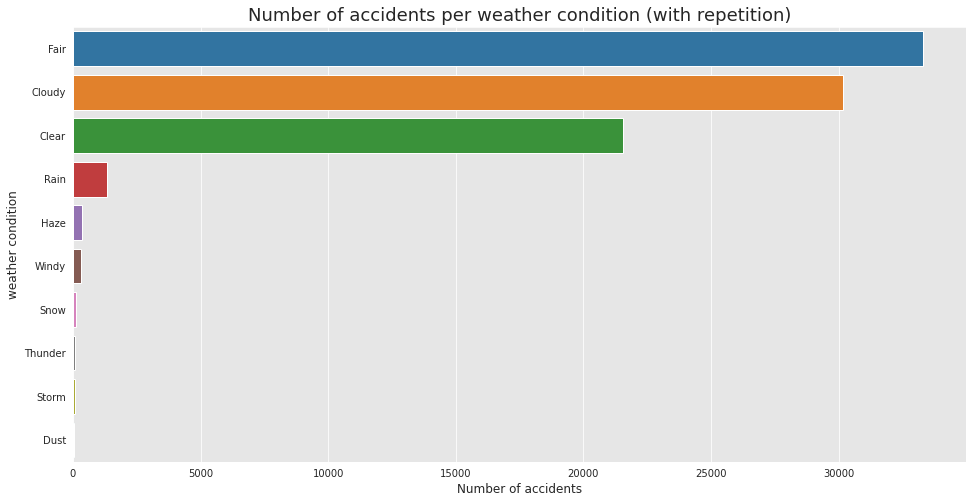

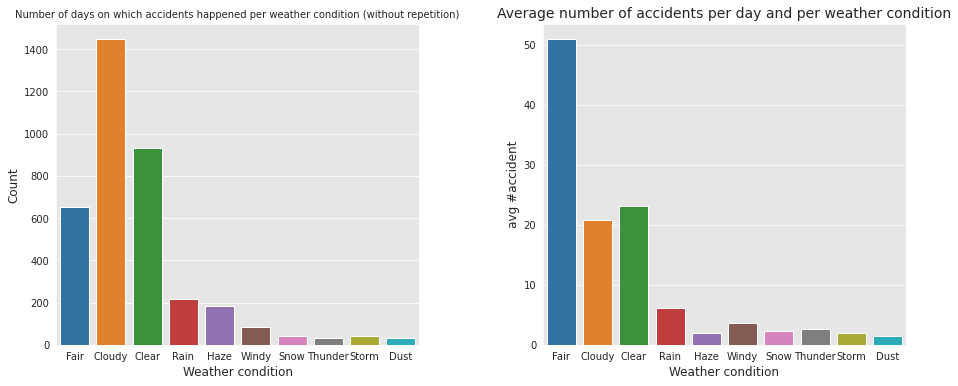

In [16]:
fig=plt.figure(figsize=(16,8))
ax = sns.countplot(y='Weather_Condition', data=df, order=df['Weather_Condition'].value_counts().index, palette='tab10')
ax.set_xlabel('Number of accidents', fontsize = 12)
ax.set_ylabel('weather condition', fontsize = 12)
ax.set_title('Number of accidents per weather condition (with repetition)', fontsize = 18)
plt.show()
print()

fig = plt.figure(figsize=(14, 6))

weather_list_df = pd.DataFrame.from_dict(weather_list.values())
weather_list_df.rename(columns={0: "count"}, inplace = True)
weather_list_df.insert(1, 'Weather_Condition', weather_list.keys())

ax1 = fig.add_subplot(121)
ax1 = sns.barplot(x='Weather_Condition', y='count', data=weather_list_df, palette='tab10')
ax1.set_xlabel('Weather condition', fontsize = 12)
ax1.set_ylabel('Count', fontsize = 12)
ax1.set_title('Number of days on which accidents happened per weather condition (without repetition)', fontsize = 10)

index = 0
for c in weather_list_df['count']:
  weather_list_df.replace(weather_list_df['count'].iloc[index], df['Weather_Condition'].value_counts()[index]/weather_list_df['count'].iloc[index], inplace=True)
  index+=1

ax2 = fig.add_subplot(122)
ax2 = sns.barplot(x='Weather_Condition', y='count', data=weather_list_df, palette='tab10')
ax2.set_xlabel('Weather condition', fontsize = 12)
ax2.set_ylabel('avg #accident', fontsize = 12)
ax2.set_title('Average number of accidents per day and per weather condition', fontsize = 14)
 
fig.tight_layout(pad=3.0)

What do we mean by **repetition**? Imagine that 5 accidents happened on a specific day and have been reported with cloudy weather conditions.
In the 1st histogram, we would consider and count all these 5 instances. While in the histogram on the bottom left, 
we would count the number of days with a specific weather condition during which at least one accident happened. So we would count this cloudy day only once. 

The plot on the bottom right shows the average number of accidents per day that happened under a specific condition.

We see that on average, if the day is fair in terms of weather, there are 51 accidents and this is the weather condition with the largest number. Then, if the day is cloudy or clear, there are around 22 accidents on avg. Surprisingly, the most unfavorable conditions are the ones during which there are fewer accidents. Our hypothesis is the following: it is certainly due to the smaller number of cars on roads at that time. Or even because they actually pay more attention when weather conditions are not that good. But again, we cannot check it here since we don't have access to traffic affluence data in AZ.

### How are accidents distributed through days, trimesters, years, and 4 years? 🗓


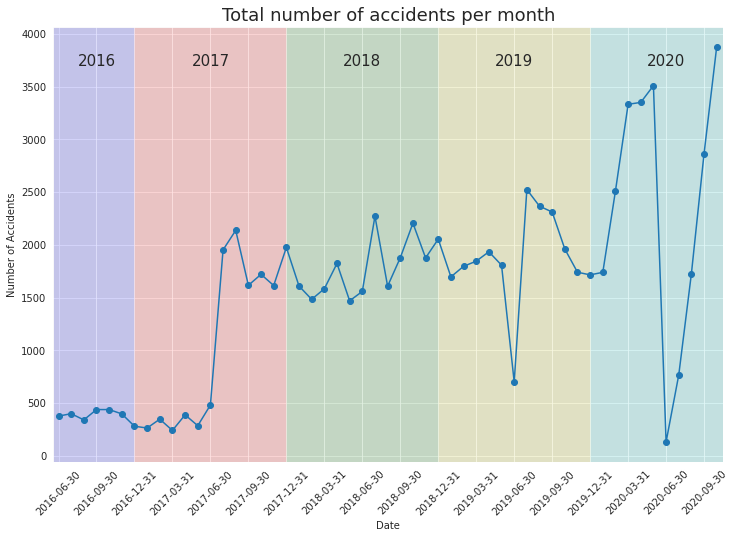

In [17]:
df['Start_Date'] = pd.to_datetime(df['Start_Date'])
bins_dt = pd.date_range(df['Start_Date'].min(), freq='1M', periods=54)
bins_str = bins_dt.astype(str).values

labels = ['({}, {}]'.format(bins_str[i-1], bins_str[i]) for i in range(1, 54)]

cat = pd.cut(df.Start_Date.astype(np.int64)//10**9, bins=bins_dt.astype(np.int64)//10**9, labels=labels)

month_count = cat.value_counts().sort_index()

fig=plt.figure(figsize=(12,8))
positions=np.arange(0, 54, 3)
lab=[]
index=0
for label in labels:
  if (index%3) == 0:
    lab.append(label[1:11])
  index+=1
ax = month_count.plot(kind = "line", rot=45, marker='o')
plt.xticks(positions, lab)
plt.title('Total number of accidents per month', fontsize = 18)
ax.set(xlabel='Date')
ax.set(ylabel='Number of Accidents')
ax.text(1.5, 3700, '2016', fontsize=15)
ax.text(10.5, 3700, '2017', fontsize=15)
ax.text(22.5, 3700, '2018', fontsize=15)
ax.text(34.5, 3700, '2019', fontsize=15)
ax.text(46.5, 3700, '2020', fontsize=15)
plt.xlim(-0.4, 52.5)
for i in positions:
  if i <= 5:
    if i == 0:
      plt.axvspan(i-0.4, i+3, facecolor='b', alpha=0.15)
    else:
      plt.axvspan(i, i+3, facecolor='b', alpha=0.15)
  elif i <= 17:
    plt.axvspan(i, i+3, facecolor='r', alpha=0.15)
  elif i <= 29:
    plt.axvspan(i, i+3, facecolor='g', alpha=0.15)
  elif i <= 41:
    plt.axvspan(i, i+3, facecolor='y', alpha=0.15)
  elif i <= 53:
    plt.axvspan(i, i+3, facecolor='c', alpha=0.15)

On the fancy-nice graph above, we can observe a relatively constant number of crashes from summer 2016 till summer 2017, just before a huge increase from 500 accidents per month (acc/m) to 2000. Through 2018 and 2018 it got a bit unstable but still between 1500 and 2350 acc/m. 

Then there is a big drop during July 2019. We investigated a bit and read that this summer was super hot. They even recorded some temperature records. Therefore, saying that the number of accidents decreased significantly because fewer people were driving because of the extreme heat is a plausible hypothesis.

Afterward, the number of acc/m went up again to form a peak at 2500 acc/m. 

The numbers during winter 2019-2020 are close to the numbers observed before the summer 2019's drop.

There is a high peak (3500 acc/m) during the second trimester of 2020.


There is a huge decrease in June 2020 (from 3500 straight to 250 acc/m). In order to explain this remarkable drop, we discussed it with some people living in Arizona. They explained that in June 2020, traveling in the state was restricted and lots of people were staying home (remote working as well). Of course, the covid had an impact on Arizona's habitants' lifestyle over the whole year but apparently, especially in June 2020. This explains this part of the plot. 


The numbers kept increasing month after month during the 2nd semester of 2020 and reached a new peak just below 4000 acc/m. 



Note that the x labels correspond to trimesters but the data is plotted for each month. We decided to not include all months in the label to avoid too much text in a small space, for better visibility. 

We are now going to visualize the average number of accidents through a day. 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:36: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future ver

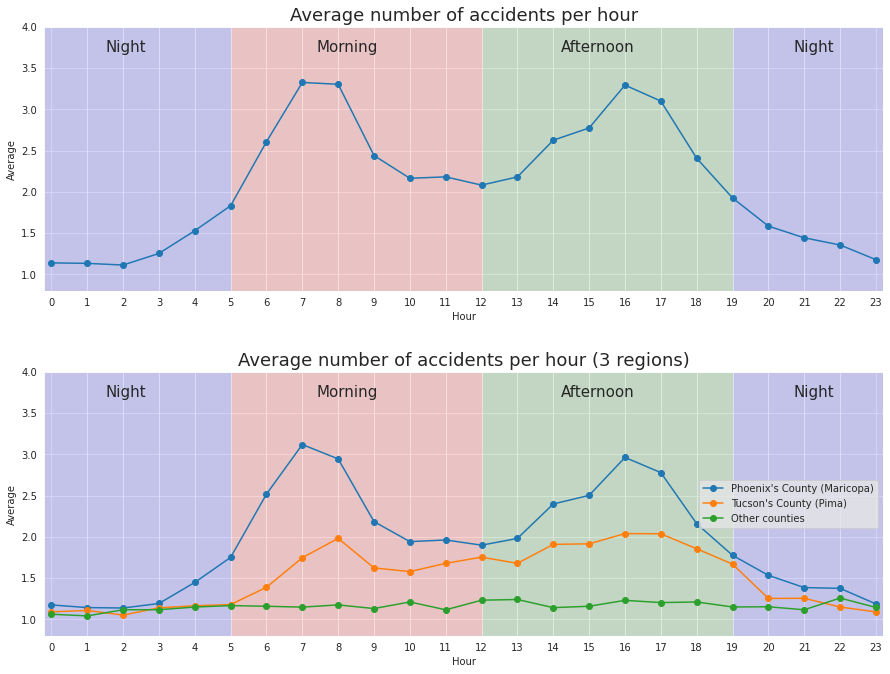

In [18]:
def get_hour_normalization_factors(dataF):

  previous_hour = -1
  index = 0

  hour_list = {'0':0, '1':0, '2':0, '3':0, '4':0, '5':0, '6':0, '7':0, '8':0, '9':0, '10':0, '11':0, '12':0, '13':0, '14':0, '15':0, '16':0, '17':0, '18':0, '19':0, '20':0, '21':0, '22':0, '23':0}
  hour_checked = {'0':False, '1':False, '2':False, '3':False, '4':False, '5':False, '6':False, '7':False, '8':False, '9':False, '10':False, '11':False, '12':False, '13':False, '14':False, '15':False, '16':False, '17':False, '18':False, '19':False, '20':False, '21':False, '22':False, '23':False}

  for hour in dataF['Start_Time_Hour']:
    if hour >= previous_hour:
      hour_checked[hour] = True
    else:
      for item in hour_checked:
        if hour_checked[item]:
          hour_list[str(item)]+=1

      hour_checked = {'0':False, '1':False, '2':False, '3':False, '4':False, '5':False, '6':False, '7':False, '8':False, '9':False, '10':False, '11':False, '12':False, '13':False, '14':False, '15':False, '16':False, '17':False, '18':False, '19':False, '20':False, '21':False, '22':False, '23':False}
      hour_checked[hour] = True

    previous_hour = hour
    index+=1
    
  return list(map(int, hour_list.values()))

df['Start_Time'] = pd.to_datetime(df['Start_Time'])
df['Start_Time_Hour'] = df['Start_Time'].dt.hour

fig=plt.figure(figsize=(13,10))

temp = df['Start_Time_Hour'].value_counts().sort_index()/get_hour_normalization_factors(df)
ax1 = fig.add_subplot(211)
ax1 = temp.plot(kind = 'line', marker='o')
ax1.set(xlabel='Hour')
ax1.set(ylabel='Average')
positions=np.arange(0, 24, 1)
plt.subplot(2,1,1)
plt.xticks(positions, positions)
plt.title('Average number of accidents per hour', fontsize = 18)
plt.xlim(-0.2, 23.2)
plt.ylim(0.8, 4)
ax1.text(1.5, 3.7, 'Night', fontsize=15)
ax1.text(7.4, 3.7, 'Morning', fontsize=15)
ax1.text(14.2, 3.7, 'Afternoon', fontsize=15)
ax1.text(20.7, 3.7, 'Night', fontsize=15)
for i in positions:
  if i <= 4:
    if i == 0:
      plt.axvspan(i-0.2, i+1, facecolor='b', alpha=0.15)
    else:
      plt.axvspan(i, i+1, facecolor='b', alpha=0.15)
  elif i <= 11:
    plt.axvspan(i, i+1, facecolor='r', alpha=0.15)
  elif i <= 18:
    plt.axvspan(i, i+1, facecolor='g', alpha=0.15)
  elif i<= 22:
    if i == 22:
      plt.axvspan(i, i+1.2, facecolor='b', alpha=0.15)
    else:
      plt.axvspan(i, i+1, facecolor='b', alpha=0.15)

Phoenix_df = df[df['County'] == 'Maricopa']
Tucson_df = df[df['County'] == 'Pima']
Countryside_df = df[(df['County'] != 'Maricopa') & (df['County'] != 'Pima')]

temp = Phoenix_df['Start_Time_Hour'].value_counts().sort_index()/get_hour_normalization_factors(Phoenix_df)
ax2 = fig.add_subplot(212)
ax2 = temp.plot(kind = 'line', marker='o', label="Phoenix's County (Maricopa)")
ax2.set(xlabel='Hour')
ax2.set(ylabel='Average')
positions=np.arange(0, 24, 1)
plt.subplot(2,1,2)
plt.xticks(positions, positions)
plt.title('Average number of accidents per hour (3 regions)', fontsize = 18)
plt.xlim(-0.2, 23.2)
plt.ylim(0.8, 4)
ax2.text(1.5, 3.7, 'Night', fontsize=15)
ax2.text(7.4, 3.7, 'Morning', fontsize=15)
ax2.text(14.2, 3.7, 'Afternoon', fontsize=15)
ax2.text(20.7, 3.7, 'Night', fontsize=15)
for i in positions:
  if i <= 4:
    if i == 0:
      plt.axvspan(i-0.2, i+1, facecolor='b', alpha=0.15)
    else:
      plt.axvspan(i, i+1, facecolor='b', alpha=0.15)
  elif i <= 11:
    plt.axvspan(i, i+1, facecolor='r', alpha=0.15)
  elif i <= 18:
    plt.axvspan(i, i+1, facecolor='g', alpha=0.15)
  elif i<= 22:
    if i == 22:
      plt.axvspan(i, i+1.2, facecolor='b', alpha=0.15)
    else:
      plt.axvspan(i, i+1, facecolor='b', alpha=0.15)

temp = Tucson_df['Start_Time_Hour'].value_counts().sort_index()/get_hour_normalization_factors(Tucson_df)
ax3 = fig.add_subplot(212)
ax3 = temp.plot(kind = 'line', marker='o', label="Tucson's County (Pima)")

temp = Countryside_df['Start_Time_Hour'].value_counts().sort_index()/get_hour_normalization_factors(Countryside_df)
ax4 = fig.add_subplot(212)
ax4 = temp.plot(kind = 'line', marker='o', label='Other counties')
plt.legend(loc="right")

fig.tight_layout(pad=3.0)

Here we can visualise where accidents happened at each hour of the day.

The different colors help to distinguish the different "shifts" of the day (morning, afternoon, and night). We arbitrarily chose 5:00 as the end of the night and 19:00 as the start. We could have made other choices to divide the day into these 3 periods but we believe that this split makes sense. Both the morning and afternoon periods are the same duration (7hours each).

**On the 1st plot**, we can observe 2 peaks occurring at 7:00-8:00 and 16:00 (both around 3.3 accidents per hour on average). 

Another interesting and expected observation is that the numbers are the lowest at night and slowly increase (starting at 2:00) to reach the morning peak. The ascent of the line is very steep between 5:00 and 7:00. It then decreases to reach the day's minimum at 12:00 before going up again to the 2nd peak. From 16:00, the numbers are gradually going down till this plateau which is between 23:00 and 2:00.


With some other visualization, we observed that a majority of the accidents happened in Phoenix and Tucson which are the 2 largest cities of AZ. 
Therefore, we were wondering whether the average distribution of accidents throughout the day is the same in these cities and their surroundings (counties) than in the rest of the state which is more the countryside (other counties). 
Our null hypothesis is that there is a significant difference between the distributions of these 2 types of areas. Indeed, we believe that accidents are most likely to happen where lots of people work because there is more traffic. So we expect to observe some peaks in the cities when people go to there or leave their jobs while having more constant values in the countryside since the traffic does not change much in this area.

This is our motivation for the **2nd plot** above. 

It turns out that our hypothesis is confirmed. The 2 cities most likely follow the same behavior while the rest of the state keeps a relatively constant avg through the day.
Still, there are some minor differences between these 2 major counties (including the 2 majors cities): Tucson has always fewer accidents than Phoenix, the morning peak of Tucson is reached at 8:00 and not 7:00, the climb to the afternoon peak of Tucson starts already at 9:00, this peak is more flattened than the Phoenix's one. Knowing that Pheonix is about twice as large as Tucson, the difference of average accident at the peak hours between the 2 cities totally make sense. Indeed, more people live and work in Phoenix so there are more traffic and more risk.


We can not observe any significant peak in the other counties, in the countryside of AZ (green line). This is a major difference (with the 2 others). 
There is still a small change of behavior (of the line plot) that can be seen at 22:00. Maybe because people come back from restaurants, farmers go back from the fields to their farms, etc. There are many possible reasons but we don't not have enough information to investigate this small local peak.

These 2 plots and these differences reveal a lot about the accidents' conditions and locations. 


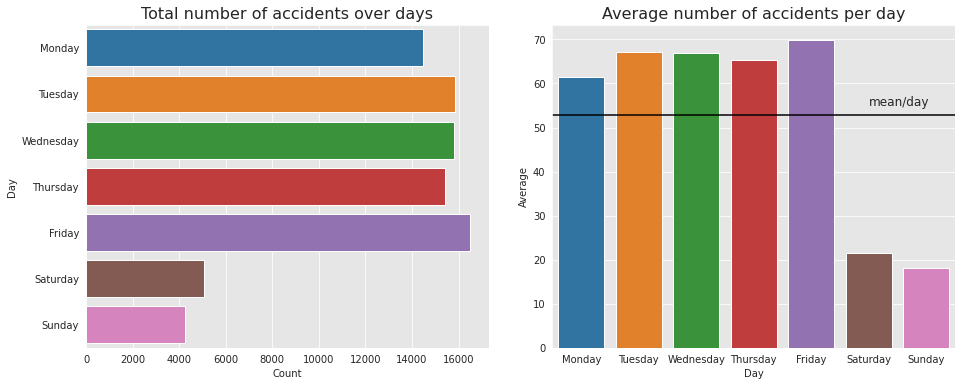

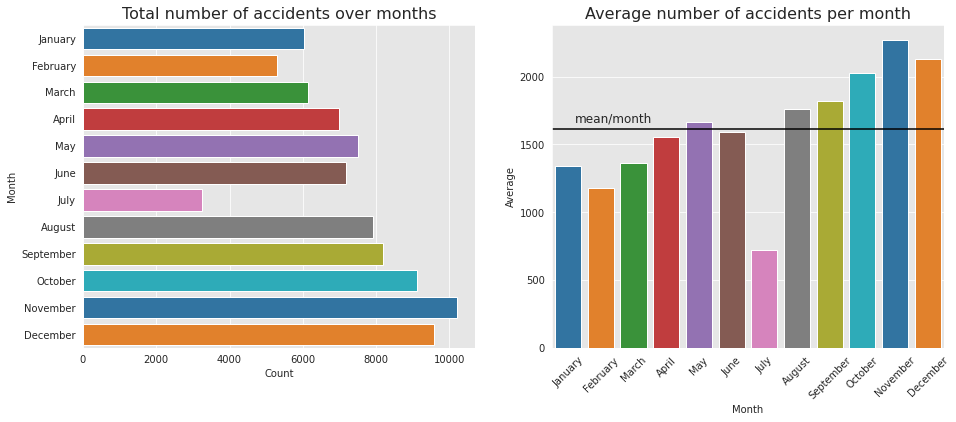

In [19]:
days=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df['Day'] = df['Start_Time'].apply(lambda x: days[x.weekday()])

fig_1=plt.figure(figsize=(14,6))

day_count = df['Day'].value_counts()
temp = day_count[4]
day_count[4] = day_count[0]
day_count[0] = temp
day_count_df = pd.DataFrame(data=day_count)
day_count_df.rename(columns={'Day': 'Count'}, inplace = True)
day_count_df.insert(1, 'Day', ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

fig1 = fig_1.add_subplot(121)
fig1 = sns.barplot(x='Count', y='Day', data=day_count_df, palette='tab10')
fig1.set_title("Total number of accidents over days", fontsize=16)

day_mean_df = day_count_df.copy()
day_mean_df['Count'] = day_mean_df['Count']/236
day_mean_value = len(df['Day'])/1654

fig11 = fig_1.add_subplot(122)
fig11 = sns.barplot(x='Day', y='Count', data=day_mean_df, palette='tab10')
fig11.axhline(day_mean_value, c='k')
fig11.text(5, 55, 'mean/day', fontsize=12)
fig11.set_title('Average number of accidents per day', fontsize = 16)
fig11.set_xlabel('Day', fontsize = 10)
fig11.set_ylabel('Average', fontsize = 10)
fig_1.tight_layout(pad=3.0)
plt.show()
print()

fig_2=plt.figure(figsize=(14,6))

months_dict = {"January":0, "February":1, "March":2, "April":3, "May":4, "June":5, "July":6, "August":7, "September":8, "October":9, "November":10, "December":11}
for item in df['Start_Month'].value_counts().index:
  months_dict[item] = df['Start_Month'].value_counts().loc[item]
months_count_df = pd.DataFrame.from_dict(months_dict.values())
months_count_df.rename(columns={0:'Count'}, inplace=True)
months_count_df.insert(1, 'Month', months_dict.keys())

fig2 = fig_2.add_subplot(121)
fig2 = sns.barplot(x='Count', y='Month', data=months_count_df, palette='tab10')
fig2.set_title('Total number of accidents over months', fontsize = 16)

month_mean_df = months_count_df.copy()
month_mean_df['Count'] = month_mean_df['Count']/4.5
month_mean_value = len(df['Start_Month'])/54

fig12 = fig_2.add_subplot(122)
fig12 = sns.barplot(x='Month', y='Count', data=month_mean_df, palette='tab10')
fig12.axhline(month_mean_value, c='k')
fig12.text(0.2, 1660, 'mean/month', fontsize=12)
fig12.set_title('Average number of accidents per month', fontsize = 16)
fig12.set_xlabel('Month', fontsize = 10)
fig12.set_ylabel('Average', fontsize = 10)
fig_2.tight_layout(pad=3.0)
plt.xticks(rotation=45)
plt.show()
print()

fig_2.tight_layout(pad=3.0)

On the **top left histogram**, we can see the distribution of the accidents over the different days. In this dataset, Friday is the day with the most number of accidents (almost 17000 between 2016 and 2020). Then, Tuesday and Wednesday are close and almost at 16000. Thursday is not far neither. About 2000 accidents less than Friday have been reported on Monday. The major takeaway from this plot is that the total number of accidents is significantly smaller during the weekend than on weekdays (between 4000 and 5000 against between 14000 and 17000).

Those numbers are interesting but not very meaningful, let's compute the averages in order to have a better view of the situation.

On the **top right plot**, we can clearly see that the average number of accidents per weekday is around 65 (between 60 and 70) and thus are all above the overall average. This is because the average of weekends is very low (around 20) and thus it decreases the mean a lot. Again, we could hypothesize that this is because there are fewer people working during weekends and therefore, less traffic in busy areas.


On the **bottom left histogram**, we observe that in total, around 9000 (8000-10000) accidents happened per month for the last 4 months of the year. 
July is the month during which the least accidents have been reported.


On the **bottom right plot**, we observe that 6 out of the 7 first months have, on average, fewer accidents than the average overall months. There is a peak in May (above the mean) with around 1700 accidents in avg. There is a local minimum in February and then the numbers increase to reach this peak. The minimum average number of accidents per month is by far in June (about 700). From August (included), the avg numbers go up and reach about 2400 in November. That's the most dangerous month during the period 2016-2020. 

### Do the time and location have an impact on the severity of the crash? 📍

In [20]:
# each frame of this gif contains the all the accidents that have happened for each hour of the day
from IPython.display import Image
Image(url='https://upload.wikimedia.org/wikipedia/commons/e/e9/AccidentsArizonaDay.gif')

We created this gif to visualize the crashes on the map, their location, their severity, and the time. Note that this is not a single day plot, these points represent all the accidents that happened a certain hour through the dataset. The color represents the severity of the crash (1 is the lightest and 4 is the most extreme). 

This visualization took way more time than expected to create it but we are glad to have it now because it provides us much useful information. 

First, we can see clearly that there is way fewer accident during the night. Also, we see that these ones are often very dark, showing that many of the night accidents are extreme. In the early morning, we see that many accidents appear on the highways leading to the big cities: Flagstaff, Phoenix and Tucson. We also observe a big circle in the center where there are lots of crashes (Phoenix). One interesting thing is that these ones are mostly light in terms of color so not severe. The size of this big bubble decreases in the middle of the day, as we have seen in previous graphs. Also, around 17:00, we see that there are a lot of accidents.  

 ### What was the most dangerous day to drive your car and avoid an accident in Arizona between 2016 and 2020? Was it Friday 13th? --  Fun fact ⛔️

In [21]:
day = df.groupby('Start_Date').count()
day.sort_values('Severity', inplace=True, ascending=False)
print('The worst day was', day.index[0], 'with', day['Severity'].iloc[0], "accidents. Sorry, that's neither a Friday nor the 13th. ")

The worst day was 2020-12-08 00:00:00 with 223 accidents. Sorry, that's neither a Friday nor the 13th. 


 ### What is the average time interval between 2 accidents? ⏳

In [22]:
df['Start_Time'] = pd.to_datetime(df['Start_Time'])
df['End_Time'] = pd.to_datetime(df['End_Time'])

df['Duration'] = df['End_Time'] - df['Start_Time']

df['Inter'] = abs(df['Start_Time'].sort_values().diff())
print(str(df['Inter'].mean())[7:15])

00:27:16


The average time interval is 27 minutes and 16 seconds. There is thus in Arizona on average on accident every 27 minutes and 16 seconds.

### Where do crashes mostly occur in Arizona? 🗺

In [23]:
fig = px.scatter_mapbox(df, lat="Start_Lat", lon="Start_Lng", 
                      color="Start_Time_Hour", size="Severity",
                      color_continuous_scale=px.colors.sequential.matter, 
                      size_max=4, zoom=4.8, 
                      center = {"lat": 34.3111, "lon": -111.5997},
                      mapbox_style="carto-positron",
                      labels={'Start_Time_Hour':'Time of the day (h)'})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Here we have created a heat map of all accidents. We can clearly guess where the big axes thanks to the continuous traces that dots are forming. If we zoom in, we can verify that those traces are main roads and highways. Moreover, we can also observe two malls at the center of the map. The biggest one is the city of Phoenix (largest in the state) and the second is Tucson, the second largest city in the state.

Feel free to play a bit with this map. If you move your mouse on a specific point, you will get some extra information about this accident.

### What are the most dangerous areas (counties) in Arizona? 📌

In [24]:
df_county = df["County"].value_counts().rename_axis('County').reset_index(name='counts')
max_count = df_county["counts"].max()
min_count = df_county["counts"].max()

# Fips code of each County of AZ
# 04001	Apache	AZ
# 04003	Cochise	AZ
# 04005	Coconino	AZ
# 04007	Gila	AZ
# 04009	Graham	AZ
# 04011	Greenlee	AZ
# 04012	La Paz	AZ
# 04013	Maricopa	AZ
# 04015	Mohave	AZ
# 04017	Navajo	AZ
# 04019	Pima	AZ
# 04021	Pinal	AZ
# 04023	Santa Cruz	AZ
# 04025	Yavapai	AZ
# 04027	Yuma	AZ

# We need to replace the County name by its fips code for the next plot
df_county["County"].replace('Apache', '04001', inplace = True)
df_county["County"].replace('Cochise', '04003', inplace = True)
df_county["County"].replace('Coconino', '04005', inplace = True)
df_county["County"].replace('Gila', '04007', inplace = True)
df_county["County"].replace('Graham', '04009', inplace = True)
df_county["County"].replace('Greenlee', '04011', inplace = True)
df_county["County"].replace('La Paz', '04012', inplace = True)
df_county["County"].replace('Maricopa', '04013', inplace = True)
df_county["County"].replace('Mohave', '04015', inplace = True)
df_county["County"].replace('Navajo', '04017', inplace = True)
df_county["County"].replace('Pima', '04019', inplace = True)
df_county["County"].replace('Pinal', '04021', inplace = True)
df_county["County"].replace('Santa Cruz', '04023', inplace = True)
df_county["County"].replace('Yavapai', '04025', inplace = True)
df_county["County"].replace('Yuma', '04027', inplace = True)

# To visualize the counties' boundaries on the map
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

fig = px.choropleth_mapbox(df_county, geojson=counties, locations='County', color='counts',
                           color_continuous_scale=px.colors.sequential.matter,
                           range_color=(min_count,max_count),
                           mapbox_style="carto-positron",
                           zoom=5, center = {"lat": 34.3111, "lon": -111.5997},
                           opacity=0.5,
                           labels={'counts':'#car accidents'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

We can observe with this map that the majority of the accidents happen in the Counties where the cities Phoenix and Tucson are located.

We can't observe much more about the other counties because their values are super low compared to the 2 main ones. We tried a normalization in order to hopefully see some differences instead of these 13 yellow Counties but it did not help enough so we kept it as unnormalized. 

### What are the most dangerous roads in Arizona? 🛣

In [25]:
df_roads = df["Street"].value_counts().rename_axis('Street').reset_index(name='counts')
max_count = df_roads["counts"].max()
min_count = df_roads["counts"].max()
df_most_roads = df_roads[df_roads["counts"] > 800]
df_roads = df[(df['Street']==df_most_roads.iloc[0][0]) | (df['Street']==df_most_roads.iloc[1][0]) | (df['Street']==df_most_roads.iloc[2][0]) | (df['Street']==df_most_roads.iloc[3][0]) | (df['Street']==df_most_roads.iloc[4][0]) | (df['Street']==df_most_roads.iloc[5][0]) | (df['Street']==df_most_roads.iloc[6][0]) | (df['Street']==df_most_roads.iloc[7][0])]

# print(df['Severity'].value_counts())

# The map shows a relevant ditribution of severity 4
fig = px.scatter_mapbox(df_roads, lat="Start_Lat", color="Severity", lon="Start_Lng",
                  color_continuous_scale=px.colors.sequential.matter, size_max=3, zoom=5, 
                  center = {"lat": 34.3111, "lon": -111.5997}, mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Here are the accidents that occurred on the 8 most dangerous roads of the data's time interval.

We can observe that the three backoning roads of the state are in the top 10 (going North, West to California, and from Tuscon to Phoenix). This might be due to the fact that they are busy roads. Then, we observe a road going East. This road might be the main way to travel East from Phoenix, we also observe that the accidents are located on an irregular road. All the turning points of this road seem to be dangerous spots because it's full of black dots (extreme severity). When we zoom in on Phoenix, we see that the rest of the worst 8 roads are the backboning roads of the city. If we zoom enough, we see that the accidents which happened at the crossroads have a minor severity. However, when looking at the ones on the entries or exits of the freeways, we see that there are many severe crashed.

In a nutshell, the roads with the most accidents are also the busiest ones of the State. In an ideal world, it would be more relevant to get the ratio between the number of accidents and the number of cars in order to find out which roads are actually the most dangerous ones. 

### Is there any relation between the weather conditions and the severity of the crash? 🌪

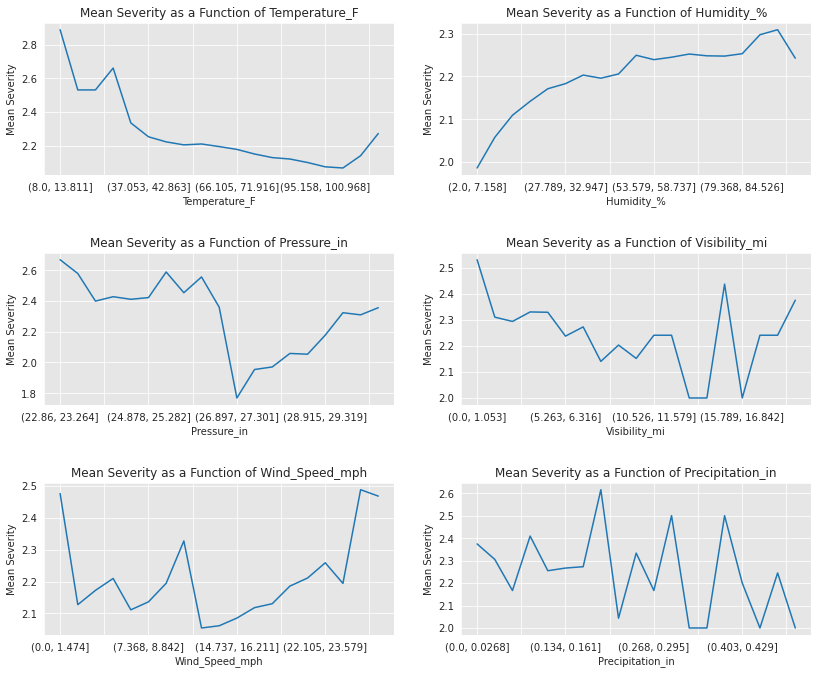

In [26]:
features = ['Temperature_F', 'Humidity_%', 'Pressure_in', 'Visibility_mi', 'Wind_Speed_mph', 'Precipitation_in']

i=1
fig = plt.figure(figsize=(12, 10))
for feature in features:
  s = '32'+str(i)
  ax = fig.add_subplot(int(s))
  temp = df["Severity"].groupby(pd.cut(df[feature], np.linspace(df[feature].min(),df[feature].max(),num=20))).mean()
  temp.fillna(temp.mean(), inplace=True)
  ax = temp.plot()
  plt.title("Mean Severity as a Function of " + feature)
  plt.xlabel(feature)
  plt.ylabel("Mean Severity")
  i+=1
fig.tight_layout(pad=3.0)


We can observe that the mean severity increases as the humidity increases.
We also see that the mean severity decreases as the temperature increases except for the highest ones.
It doesn't seem like the others have any correlation with the severity of the accidents.

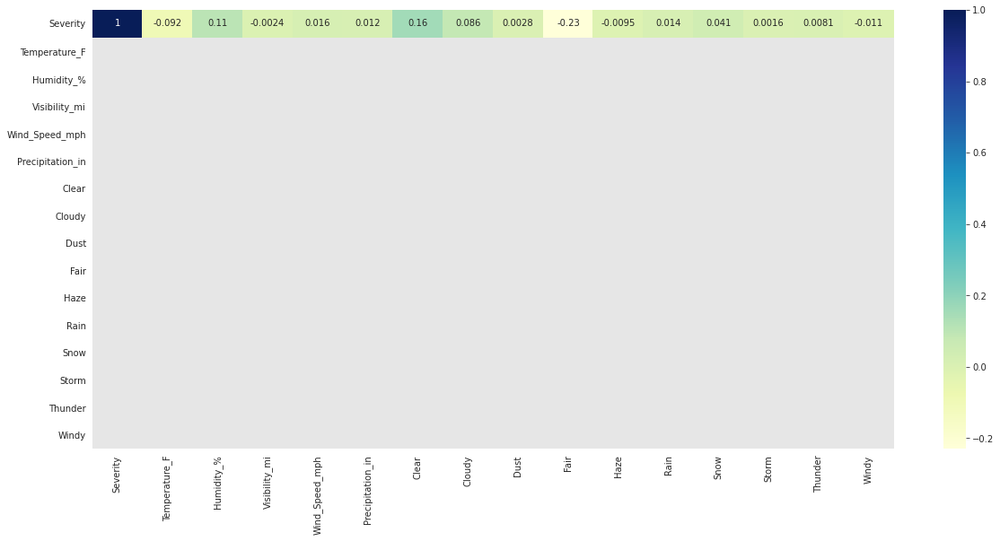

In [27]:
df_severity_weather = df[['Severity', 'Temperature_F', 'Humidity_%', 'Visibility_mi', 'Wind_Speed_mph', 'Precipitation_in']]

# add a dummy column for each cotegory in the column weather condition
dummy = pd.get_dummies(df['Weather_Condition'])
df_severity_weather = pd.concat([df_severity_weather,dummy],axis=1)

fig= plt.subplots(figsize =(20, 9))

mask = np.ones((df_severity_weather.columns.size, df_severity_weather.columns.size), dtype=bool)

for i in range(df_severity_weather.columns.size):
    mask[0,i]= False

sns.heatmap(df_severity_weather.corr(), annot = True, cmap="YlGnBu", mask = mask)


As this correlation heat map shows, there are some correlations between the severity and the weather conditions.

The positive correlation between humidity and severity confirms the observation that we just made above. There is also a positive one with clear and a very small one with cloudy. Fair has a negative correlation with the severity. 

### What are the road facilities that are included in accidents? Which ones are the most present? 🚦

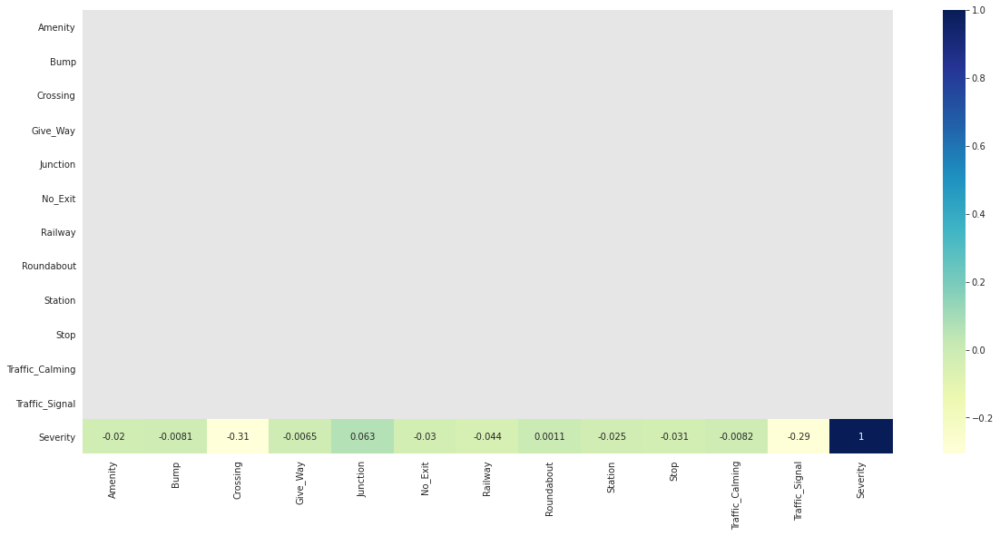

In [28]:
df_severity_weather = df[df.columns[19:31]]

# add a dummy column for each cotegory in the column weather condition
dummy = df['Severity']
df_severity_weather = pd.concat([df_severity_weather,dummy],axis=1)

fig= plt.subplots(figsize =(20, 9))

mask = np.ones((df_severity_weather.columns.size, df_severity_weather.columns.size), dtype=bool)

for i in range(df_severity_weather.columns.size):
    mask[df_severity_weather.columns.size-1,i]= False


sns.heatmap(df_severity_weather.corr(), annot = True, cmap="YlGnBu", mask= mask)

We see that there is a negative correlation of 0.31 between road crossings and the severity meaning that if there is an accident at a crossing, the severity is more likely to below. 
This links to our observations from zoom on the map of Phoenix on which we saw that accidents at crossings have a low severity.

It's the same for the traffic signals, there is a negative correlation. Traffic signal are usually at road crossings so it makes sense. 



Text(0.5, 1.0, 'Number of accidents with specific road facility')

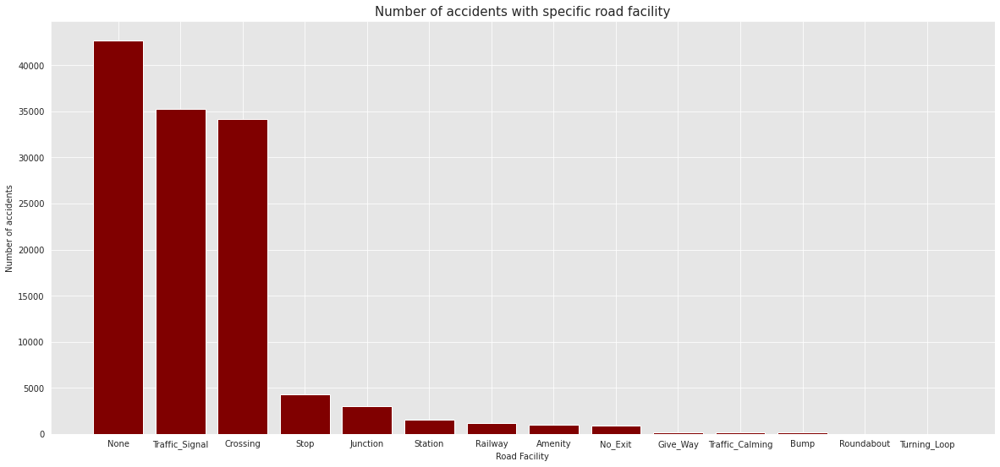

In [29]:
road_obstacles_boolean = df[df.columns[19:32]]

road_obstacles_int = road_obstacles_boolean.astype(int)
obs_counts = road_obstacles_int.sum(axis = 1).value_counts()


# Here are the different occurences of accident obstacles in ascending order
# Useful to answer research question 3
road_obstacles_true_freq = road_obstacles_int.isin([1]).sum().sort_values(ascending=False)
# add a column where no road obstacles are involved
s = pd.Series(index = ["None"],data = obs_counts[0])
road_obstacles_true_freq = road_obstacles_true_freq.append(s).sort_values(ascending=False)

fig, ax = plt.subplots(figsize =(20, 9))

plt.bar(road_obstacles_true_freq.index,road_obstacles_true_freq.values,color ='maroon')
plt.xlabel("Road Facility")
plt.ylabel("Number of accidents")
plt.title("Number of accidents with specific road facility", fontsize=15)

Here we can observe that most of the accidents do not include any specific road obstacle/infrastructure. Many crashes occur at traffic signals and road crossings. The others are minor classes compared to these 3.

*****

*****
## 7. Severity Prediction Model 🌳

In [30]:
from IPython.display import Image, display  
import pydotplus 
from scipy import misc
from sklearn import tree

def renderTree(my_tree, features):
    filename = "temp.dot"
    with open(filename, 'w') as f:
        f = tree.export_graphviz(my_tree, 
                                 out_file=f, 
                                 feature_names=features, 
                                 class_names=["1", "2","3","4"],  
                                 filled=True, 
                                 rounded=True,
                                 special_characters=True)
  
    dot_data = ""
    with open(filename, 'r') as f:
        dot_data = f.read()

    graph = pydotplus.graph_from_dot_data(dot_data)
    image_name = "temp.png"
    graph.write_png(image_name)  
    display(Image(filename=image_name))

In [31]:
# We choosed to remove the start time attribute because we already kept the start hour one
# The street feature is not useful anymore since it is covered by the starting latitude and longitude
# Moreover, building a classifier using the street factor will produce smaller clusters
# Same logic for the description attribute
df_predict = df.drop(columns= ["Inter","Start_Time" ,"Start_Date","End_Time","Description","Street","Weather_Timestamp"])

# Here, we convert every object column into integer to let the decision tree function interpret them 
num, cat = pd.factorize(df_predict['Day'])
df_predict['Day'] = num

num, cat = pd.factorize(df_predict['County'])
df_predict['County'] = num

num, cat = pd.factorize(df_predict['Weather_Condition'])
df_predict['Weather_Condition'] = num

num, cat = pd.factorize(df_predict['Start_Month'])
df_predict['Start_Month'] = num

num, cat = pd.factorize(df_predict['Sunrise_Sunset'])
df_predict['Sunrise_Sunset'] = num

num, cat = pd.factorize(df_predict['Duration'])
df_predict['Duration'] = num

num, cat = pd.factorize(df_predict['Wind_Direction'])
df_predict['Wind_Direction'] = num

### Decision Tree Classifier

Let's first construct a decision tree to get an idea of how the severity can be classified for a given accident.

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
from sklearn import metrics

# set X and y from the data frame
y = df_predict["Severity"]
X = df_predict.drop("Severity", axis=1)

# Split the data set into training and testing data sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Split the data set into training and validation data sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3, stratify=y_train, random_state=42)

# Creation of the decision tree object instance
decisionTree = tree.DecisionTreeClassifier()

# Fit the training data
decisionTree.fit(X_train,y_train)

# Predictions on training and testing sets
y_pred_test=decisionTree.predict(X_test)
y_pred_train=decisionTree.predict(X_train)

print('Training accuracy:', accuracy_score(y_train, y_pred_train))
print('Testing accuracy:', accuracy_score(y_test, y_pred_test))
print("Balanced train set accuracy score:", metrics.balanced_accuracy_score(y_train, y_pred_train))
print("Balanced test set accuracy score:", metrics.balanced_accuracy_score(y_test, y_pred_test))
print(metrics.classification_report(y_test, y_pred_test))

print("Confusion Matrix:")
print(metrics.confusion_matrix(y_test, y_pred_test))

Training accuracy: 0.9992991472958767
Testing accuracy: 0.8265796703296703
Balanced train set accuracy score: 0.9959657990672531
Balanced test set accuracy score: 0.6956082682139784
              precision    recall  f1-score   support

           1       0.91      0.91      0.91      2000
           2       0.89      0.89      0.89     19162
           3       0.60      0.60      0.60      4000
           4       0.34      0.38      0.36      1046

    accuracy                           0.83     26208
   macro avg       0.69      0.70      0.69     26208
weighted avg       0.83      0.83      0.83     26208

Confusion Matrix:
[[ 1817   133    21    29]
 [  129 17029  1427   577]
 [   20  1410  2419   151]
 [   26   484   138   398]]


We can clearly notice that the model overfits the data since we have more than 99.9% of training accuracy. The testing accuracy is quite high, which suggests that this kind of prediction model is promising.

If we look at the balanced accuracy score, which is the average of the recall, we see that it's not very high (0.69). This metric might be better to determine the performance of this tree since our data is super unbalanced (see the histogram a bit below).


We also see that the recall is pretty good for classes 1 and 2 but a bit low for the 3rd one and super low for the 4th one (0.36). Its precision is bad as well.


We can try to correct the overfitting by tuning two parameters, the maximum tree depth and the minimum sample split needed. 

Let's first look at the balanced accuracy of the different configurations.

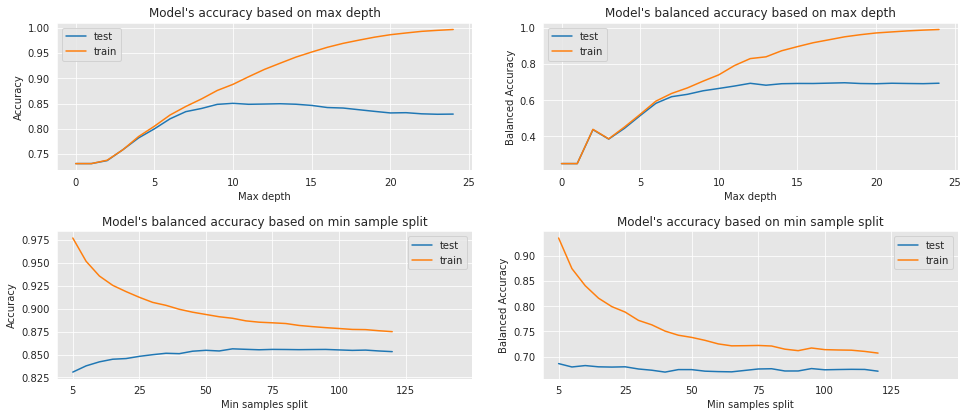

In [33]:
accuracy_train = []
accuracy_test = []
balanced_accuracy_train = []
balanced_accuracy_test = []

# Here, we iterate 25 times the model by increasing the max depth each time
# We store the testing and training accuracy of each instance in different lists before ploting them
for i in range(25):

  # Creation of the decision tree object instance
  decisionTree = tree.DecisionTreeClassifier(random_state=42, max_depth=i+1)

  decisionTree.fit(X_train,y_train)

  y_pred_test=decisionTree.predict(X_test)
  y_pred_train=decisionTree.predict(X_train)

  # Model Accuracy, how often is the classifier correct?
  accuracy_test.append(accuracy_score(y_test, y_pred_test))
  accuracy_train.append(accuracy_score(y_train, y_pred_train))
  balanced_accuracy_test.append(metrics.balanced_accuracy_score(y_test, y_pred_test))
  balanced_accuracy_train.append(metrics.balanced_accuracy_score(y_train, y_pred_train))

fig = plt.figure(figsize=(14,6))

ax1 = fig.add_subplot(221)
ax1 = plt.plot(accuracy_test, label='test')
plt.title("Model's accuracy based on max depth") 
plt.plot(accuracy_train, label='train')
plt.xlabel('Max depth')
plt.ylabel('Accuracy')
plt.legend()

ax2 = fig.add_subplot(222)
ax2 = plt.plot(balanced_accuracy_test, label='test')
plt.plot(balanced_accuracy_train, label='train')
plt.title("Model's balanced accuracy based on max depth") 
plt.xlabel('Max depth')
plt.ylabel('Balanced Accuracy')
plt.legend()
fig.tight_layout(pad=3.0)

accuracy_train = []
accuracy_test = []
balanced_accuracy_train = []
balanced_accuracy_test = []

# Let's repeat the same process for the minimum samples split and plot the accuracy again
for i in range(25):

  decisionTree = tree.DecisionTreeClassifier(random_state=42, min_samples_split=(i+1)*5)

  decisionTree.fit(X_train,y_train)
  
  y_pred_test=decisionTree.predict(X_test)
  y_pred_train=decisionTree.predict(X_train)

  # Model Accuracy, how often is the classifier correct?
  accuracy_test.append(accuracy_score(y_test, y_pred_test))
  accuracy_train.append(accuracy_score(y_train, y_pred_train))
  balanced_accuracy_test.append(metrics.balanced_accuracy_score(y_test, y_pred_test))
  balanced_accuracy_train.append(metrics.balanced_accuracy_score(y_train, y_pred_train))

ax3 = fig.add_subplot(223)
ax3 = plt.plot(accuracy_test, label='test')
plt.plot(accuracy_train, label='train')
plt.xlabel('Min samples split')
plt.ylabel('Accuracy')
plt.title("Model's balanced accuracy based on min sample split") 
plt.xticks(np.arange(0,31,5), ['5','25','50','75','100', '125'])
plt.legend()

ax4 = fig.add_subplot(224)
ax4 = plt.plot(balanced_accuracy_test, label='test')
plt.plot(balanced_accuracy_train, label='train')
plt.xlabel('Min samples split')
plt.ylabel('Balanced Accuracy')
plt.xticks(np.arange(0,31,5), ['5','25','50','75','100', '125'])
plt.title("Model's accuracy based on min sample split") 
plt.legend()
plt.show()

The top right plot shows that the model stops improving on the test set accuracy around a depth of 9. Thus, it is worthless to pick a tree which is going deeper than this value.

As expected, the training accuracy of the bottom right plot decreases with respect to the minimum sample split augmentation. This is due to the model that is prevented from creating small clusters and then overfitting. 


These 2 plots represent the accuracy score but if we want to use the balanced accuracy one as the performance metric of the tree (since we have unbalanced data), let's look at the 2 plots on the right column. 

We see that the test balanced accuracy stops improving at a max depth of around 12. We also observe (bottom graph) that the test balanced accuracy stays more or less constant no matter the min sample split. If we want to be precise, we can say that it even decreases as the min sample split increases.

Let's now create 2 new decision trees using the parameters leading to an optimal data fitting (based on the accuracy and the balanced accuracy). With a maximum depth of 9 and a minimum of 40 samples to split into new clusters, the training accuracy should decrease but stay high (not overfitting).
While with a maximum depth of 12 and a minimum of 5 samples to split into new clusters, the training balanced accuracy should decrease and stay high (not overfitting).



In [34]:
# First tree, parameters tuning based on the accuracy
decisionTree1 = tree.DecisionTreeClassifier(max_depth=9, min_samples_split=40)
decisionTree1.fit(X_train,y_train)

y_pred_test=decisionTree1.predict(X_test)
y_pred_train=decisionTree1.predict(X_train)

print('Training accuracy:', accuracy_score(y_train, y_pred_train))
print('Testing accuracy:', accuracy_score(y_test, y_pred_test))
print(metrics.classification_report(y_test, y_pred_test))

# print(metrics.roc_auc_score(y_train, y_pred_train, multi_class='ovr'))
# renderTree(decisionTree, df_predict.drop(columns=['Severity']).columns)

Training accuracy: 0.8551804695713118
Testing accuracy: 0.841231684981685
              precision    recall  f1-score   support

           1       0.95      0.86      0.90      2000
           2       0.87      0.94      0.90     19162
           3       0.67      0.54      0.59      4000
           4       0.48      0.20      0.29      1046

    accuracy                           0.84     26208
   macro avg       0.74      0.63      0.67     26208
weighted avg       0.83      0.84      0.83     26208



Now, we get better results for the test set (accuracy: 0.8412 > 0.8271) and the model does not overfit the data anymore (accuracy: 0.99 to 0.85 on the training set). 

In [35]:
# Second tree, parameters tuning based on the balanced accuracy
decisionTree2 = tree.DecisionTreeClassifier(max_depth=12, min_samples_split=5)
decisionTree2.fit(X_train,y_train)

y_pred_test=decisionTree2.predict(X_test)
y_pred_train=decisionTree2.predict(X_train)

print("Balanced accuracy of train set:", metrics.balanced_accuracy_score(y_train, y_pred_train))
print("Balanced accuracy of test set:", metrics.balanced_accuracy_score(y_test, y_pred_test))
print(metrics.classification_report(y_test, y_pred_test))

# print(metrics.roc_auc_score(y_train, y_pred_train, multi_class='ovr'))
# renderTree(decisionTree, df_predict.drop(columns=['Severity']).columns)


Balanced accuracy of train set: 0.7833234400151625
Balanced accuracy of test set: 0.6800035106477667
              precision    recall  f1-score   support

           1       0.94      0.90      0.92      2000
           2       0.89      0.92      0.91     19162
           3       0.66      0.64      0.65      4000
           4       0.45      0.26      0.33      1046

    accuracy                           0.85     26208
   macro avg       0.73      0.68      0.70     26208
weighted avg       0.84      0.85      0.84     26208



We limited the depth and the min sample split of the tree and got a lower balanced accuracy on the training set (0.68) which might be good because the old one was very high (0.99 - overfitting). The balanced accuracy of the test set decreases just by around 0.02 but the tree is now smaller so that's good.

### Decision Tree using data resampling

2    63871
3    13333
1     6668
4     3487
Name: Severity, dtype: int64


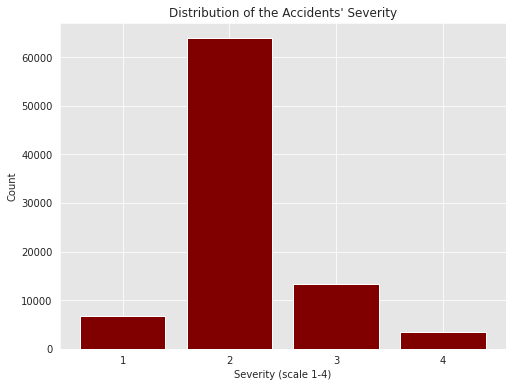

In [36]:
fig = plt.figure(figsize=(8, 6))

positions = np.arange(1,5,1)
plt.bar(df_predict['Severity'].value_counts().index,df_predict['Severity'].value_counts().values,color ='maroon')
plt.xticks(positions, positions)
plt.xlabel("Severity (scale 1-4)")
plt.ylabel("Count")
plt.title("Distribution of the Accidents' Severity")
print(df_predict['Severity'].value_counts())

As we can see above and as stated before, the data is very unbalanced. As discussed a bit in class, there are multiple options to deal with that. We also did some online research to find the best solution. Since the severity 4 class has only a few hundred samples, downsampling the other classes do not seem like a good idea. We are going to upsample classes 1, 3, and 4 so that each of these has the same number of instances (63871). Then we will check the performance of the tree using normal accuracy since the data will be balanced with these new instances.

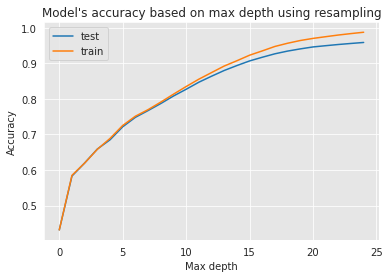

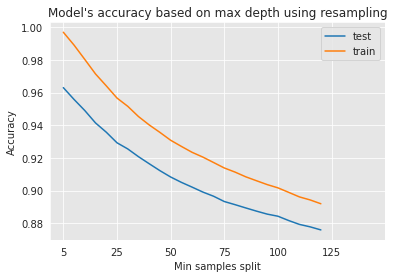

In [37]:
from sklearn.utils import resample

# clustering into the different severity classes
s1 = df_predict[df_predict['Severity']==1]
s2 = df_predict[df_predict['Severity']==2]
s3 = df_predict[df_predict['Severity']==3]
s4 = df_predict[df_predict['Severity']==4]

# given by the above bar plot
max_class = len(s2)

# creating extra samples that balance the different classes
s1 = resample(s1, replace=s1.count()[0]<max_class, n_samples=max_class, random_state=42)
s3 = resample(s3, replace=s3.count()[0]<max_class, n_samples=max_class, random_state=42)
s4 = resample(s4, replace=s4.count()[0]<max_class, n_samples=max_class, random_state=42)
 
# Combine majority class with upsampled minority class
df_predict_resample = pd.concat([s1, s2, s3, s4])
 
# set X and y
y = df_predict_resample["Severity"]
X = df_predict_resample.drop("Severity", axis=1)

# To find the best hyper parameters
accuracy_train = []
accuracy_test = []
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

# Here, we iterate 25 times the model by increasing the max depth each time
# We store the testing and training accuracy of each instance in different lists before ploting them
for i in range(25):

  # Creation of the decision tree object instance
  decisionTree = tree.DecisionTreeClassifier(random_state=42, max_depth=i+1)

  decisionTree.fit(X_train,y_train)

  y_pred_test=decisionTree.predict(X_test)
  y_pred_train=decisionTree.predict(X_train)

  # Model Accuracy, how often is the classifier correct?
  accuracy_test.append(accuracy_score(y_test, y_pred_test))
  accuracy_train.append(accuracy_score(y_train, y_pred_train))

ax1 = plt.plot(accuracy_test, label='test')
plt.title("Model's accuracy based on max depth using resampling") 
plt.plot(accuracy_train, label='train')
plt.xlabel('Max depth')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


fig.tight_layout(pad=3.0)

accuracy_train = []
accuracy_test = []
balanced_accuracy_train = []
balanced_accuracy_test = []

# Let's repeat the same process for the minimum samples split and plot the accuracy again
for i in range(25):

  decisionTree = tree.DecisionTreeClassifier(random_state=42, min_samples_split=(i+1)*5)

  decisionTree.fit(X_train,y_train)
  
  y_pred_test=decisionTree.predict(X_test)
  y_pred_train=decisionTree.predict(X_train)

  # Model Accuracy, how often is the classifier correct?
  accuracy_test.append(accuracy_score(y_test, y_pred_test))
  accuracy_train.append(accuracy_score(y_train, y_pred_train))


ax3 = plt.plot(accuracy_test, label='test')
plt.plot(accuracy_train, label='train')
plt.xlabel('Min samples split')
plt.ylabel('Accuracy')
plt.title("Model's accuracy based on max depth using resampling") 
plt.xticks(np.arange(0,31,5), ['5','25','50','75','100', '125'])
plt.legend()

plt.show()

We see that both accuracies keep increasing as the max depth increases. They both decrease as the min samples split increases. This is because decision have naturally the tendency the overfit when they are given the opportunity to growth as big as they want, leading to make too specific classifications.

Let's check the performance of the tree with no limits.

In [38]:
decisionTree = tree.DecisionTreeClassifier()

decisionTree.fit(X_train,y_train)

y_pred_test=decisionTree.predict(X_test)
y_pred_train=decisionTree.predict(X_train)

print('Training accuracy with resampled data:', accuracy_score(y_train, y_pred_train))
print('Testing accuracy with resampled data:', accuracy_score(y_test, y_pred_test))

print(metrics.classification_report(y_test, y_pred_test))


Training accuracy with resampled data: 0.9994296514163656
Testing accuracy with resampled data: 0.967095477911437
              precision    recall  f1-score   support

           1       0.99      1.00      1.00     19162
           2       0.99      0.88      0.93     19161
           3       0.92      0.99      0.96     19162
           4       0.97      1.00      0.98     19161

    accuracy                           0.97     76646
   macro avg       0.97      0.97      0.97     76646
weighted avg       0.97      0.97      0.97     76646



Both training and test accuracies are very high (above 95%). 
We have studied that decision tree classifiers tend to overfit a lot. Let's find another/better solution.

### Can a model predict the severity of an accident based on some features? What are the best one's performance results? 🧑‍⚖️

Another solution to deal with unbalanced data and to reduce overfitting is **random forest**. We expect better results since the random forest is an ensemble of DT. Let's create one. 

In [39]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=42)

model = RandomForestClassifier(random_state=42)

rf = model.fit(X_train, y_train)

y_pred_train = rf.predict(X_train)
print('Accuracy on training data=', metrics.accuracy_score(y_true = y_train, y_pred = y_pred_train))

y_pred = rf.predict(X_test)
print('Accuracy on test data=', metrics.accuracy_score(y_true = y_test, y_pred = y_pred))

sum = 0
for t in rf.estimators_:
  x = t.get_depth()
  sum+=x

# We know that the number of predictors in model is large and it make it complex but the computation time is reasonable and the accuracy good
print('Average random forest tree depth:', sum/len(rf.estimators_))

print(metrics.classification_report(y_test, y_pred))


Accuracy on training data= 0.9994296514163656
Accuracy on test data= 0.9767763484069619
Average random forest tree depth: 41.62
              precision    recall  f1-score   support

           1       0.99      1.00      1.00     19162
           2       0.99      0.92      0.95     19161
           3       0.94      0.99      0.97     19162
           4       0.99      1.00      0.99     19161

    accuracy                           0.98     76646
   macro avg       0.98      0.98      0.98     76646
weighted avg       0.98      0.98      0.98     76646



Wow It looks like this random forest works very well. 

The results are way better than the ones from our different trees. Indeed, the first tree had a balanced accuracy of 0.69 on the test set while this one hits 0.98 while the training accuracy is maintained. 

Since this forest is an ensemble of decision trees, it's more robust and overfits way less than the classical DT. It also deals very well with our super unbalanced data. This model outperfoms the DT as well, which had balanced data (resampled one).  


*****
## 8. Conclusion 🙌

In this work, we analysed the road accidents that happened in Arizona between June 2016 and December 2020. We managed to answer all our research questions. Here are our major results about the accidents:
*  They mostly occur on busy highways leading to the 3 main AZ cities.
*  There are 2 crashes peaks per day which correspond to the start/end work hours.
* There are way few crashes at night but they are mostly pretty severe.
* The average time between 2 accidents is 27 minutes.
* Crashes that occur in the city centers are usually less severe than the ones in the countryside.
* There are way more accidents during Winter than the rest of the year.
* The safest month to drive is July.
* The safest days to drive are Saturdays and Sundays.
* COVID 19's lockdown rules had a decreasing impact on the number of accidents in summer 2020.
* Our random forest can predict the severity of a specific unknown crash (given its features) with an accuracy of 95%.

Our findings are certainly useful for all Arizona drivers who might know how, when, and where accidents occur on the road and, from there, know when to be more vigilant on the road. Moreover, any institution willing to increase road safety or sensitize road users, might also be interested in some of our results. They could for example adapt the traffic regulations such as the speed limit in specific zones.


An interesting future work would be to use AZ traffic's data and combine it with these results in order to get some deeper knowledge and comprehension about the accidents' causes. 

Thank you for reading our work. We hope you enjoyed and liked it. Even if we worked a **lot**, we did enjoy the process and are very happy to have reached these results. 

You and we now know what to (not) do for our next road trip in Arizona. 🚘 😎 🇺🇸

Our storytelling video: https://www.youtube.com/watch?v=evqb9hHEnPo

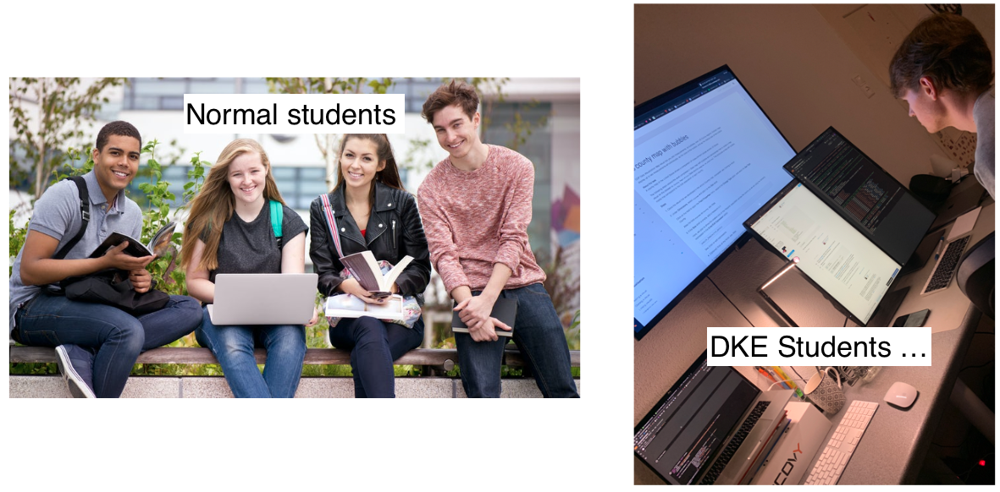